# simple synthetic inversion

Here we try to recover the true Layer 1 topography with a gravity inversion. We start with the forward gravity of Layer 1 as the observed gravity, then down-sample this gravity to represent a coarser gravity survey, and final, repeate these steps with a regional component including in the observed gravity. The regional component is the forward gravity of Layer 2. 

We also explore adding gaussian noise to these gravity data. 

The starting (low-resolution) Layer 1 topography has been created through the random sampling and gridding of 30 points. In an Antarctic setting, these points represent single seismic survey locations which measure the elevation of Layer 1. 

import packages

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext snakeviz

import sys

from RIS_gravity_inversion import plotting, optimization, synthetic, regional
import RIS_gravity_inversion.inversion as inv
import RIS_gravity_inversion.utils as inv_utils

import copy
from antarctic_plots import utils, regions, maps, fetch, profile
import zarr
import harmonica as hm
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import verde as vd
import scipy as sp
import pvxarray
import rioxarray
import pygmt
import plotly.graph_objects as go
import optuna
from optuna.storages import JournalStorage, JournalFileStorage
import warnings
import os
import pathlib
import string
import itertools
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import pickle
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from tqdm.contrib.itertools import product
from tqdm.autonotebook import tqdm

sns.set_theme()

# Load data

## topographic layers
* 2 full resolution synthetic layers
* low resolution layer 2

In [2]:
layer1 = xr.open_zarr("../../synthetic_data/synthetic_layer1.zarr").z

layer2 = xr.open_zarr("../../synthetic_data/synthetic_layer2.zarr").z

starting_layer1 = xr.open_zarr("../../synthetic_data/synthetic_lowres_layer1.zarr").z

# ensure all xarray are same data type
layer1 = layer1.astype(np.float64)
layer2 = layer2.astype(np.float64)
starting_layer1 = starting_layer1.astype(np.float64)

print(utils.get_grid_info(layer1))
print(utils.get_grid_info(layer2))
print(utils.get_grid_info(starting_layer1))
starting_layer1

/home/tankerma/miniconda/envs/RIS_gravity_inversion/lib/python3.10/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


(1000.0, [-6000.0, 86000.0, -6000.0, 66000.0], -952.152099609, -481.448486328, 'g')
(1000.0, [-6000.0, 86000.0, -6000.0, 66000.0], -4689.66455078, -3614.13256836, 'g')
(1000.0, [-6000.0, 86000.0, -6000.0, 66000.0], -950.269714355, -378.920135498, 'g')


<xarray.DataArray 'z' (northing: 73, easting: 93)>
dask.array<open_dataset-e1bbb7ecc6b0dd52c96800cb9875ee45z, shape=(73, 93), dtype=float64, chunksize=(73, 93), chunktype=numpy.ndarray>
Coordinates:
  * easting   (easting) float64 -6e+03 -5e+03 -4e+03 ... 8.4e+04 8.5e+04 8.6e+04
  * northing  (northing) float64 -6e+03 -5e+03 -4e+03 ... 6.5e+04 6.6e+04
Attributes:
    metadata:  Generated by Spline(mindist=0)

## gravity data
* full resolution forward gravity of Layer 1
* full resolution with regional component
* sampled forward gravity of Layer 1
* sampled with regional component

In [3]:
# full resolution gravity point data
grav = pd.read_csv(
    "../../synthetic_data/synthetic_simple_full_res_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
print(len(grav[grav.test]))
print(len(grav[grav.test == False]))
grav

14540
4941


,northing,easting,Surface1,Surface2,forward_total,test,upward
0,0.0,0.0,4.895946,-1.585934,3.310012,False,1000.0
1,0.0,500.0,4.832540,-1.641775,3.190765,True,1000.0
2,0.0,1000.0,4.764286,-1.697236,3.067050,False,1000.0
3,0.0,1500.0,4.692135,-1.752310,2.939826,True,1000.0
4,0.0,2000.0,4.616825,-1.806994,2.809832,False,1000.0
...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,9.220126,False,1000.0
19477,60000.0,78500.0,0.821796,8.327652,9.149448,True,1000.0
19478,60000.0,79000.0,0.821311,8.246703,9.068014,False,1000.0
19479,60000.0,79500.0,0.820943,8.153546,8.974489,True,1000.0


# Set region and parameters

Use the same regions and parameters as `synthetic_model_2layer.ipynb`

In [4]:
layer_spacing, buffer_region, _, _, registration = utils.get_grid_info(layer2)

# set gravity observation parameters
grav_observation_height = 1e3
grav_spacing = 1e3
sampled_grav_spacing = 2e3

inversion_region = utils.alter_region(
    buffer_region,
    zoom=6e3,
)[0]

# set density contrast
density = 2300 - 1024

print(f"spacing: {layer_spacing}m")
print(f"registration: {registration}")
print("inversion region = ", inversion_region)
print("buffer region = ", buffer_region)

spacing: 1000.0m
registration: g
inversion region =  [0.0, 80000.0, 0.0, 60000.0]
buffer region =  [-6000.0, 86000.0, -6000.0, 66000.0]


# Prep data

## grav data

In [5]:
full_res_grav = inv_utils.prep_grav_data(
    grav,
    region=inversion_region,
    input_grav_name="forward_total",
    input_coord_names=("easting", "northing", "upward"),
)

print(f"full resolution gravity: {len(full_res_grav)} points")

print(f"gravity avg. elevation: {int(np.nanmean(full_res_grav.upward))}")

full resolution gravity: 19481 points
gravity avg. elevation: 1000


## constraint points

In [6]:
# load constraint points into a dataframe
constraints_all = pd.read_csv(
    "../../synthetic_data/synthetic_constraints.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# ensure all points are within inversion region
constraints = utils.points_inside_region(
    constraints_all, inversion_region, names=("easting", "northing")
)

print(f"bathymetry control points:{len(constraints)}")
constraints.head()

bathymetry control points:30


,easting,northing,upward
0,33693.672357,7507.422695,-730.639763
1,56744.661502,25582.027000,-684.765417
2,2008.692486,55641.813688,-547.650670
3,24977.275520,31857.255958,-732.211495
4,13153.447702,40745.118381,-788.180820


# Gravity misfit

The `gravity misfit` is defined as the difference between the observed and predicted gravity:

$G_{misfit} = G_{obs} - G_{forward}$ 

To determine $G_{misfit}$, we need to forward model the gravitational effect of the starting Layer 1 density contrast. This will be the input into our inversion.


## layer 1 prisms

In [15]:
# create prisms around starting layer 1
# positive densities above reference, negative below
print(f"Layer 1 density contrast: {density}kgm-3")

layer1_prisms = inv_utils.grids_to_prisms(
    surface=starting_layer1,
    reference=starting_layer1.values.mean(),
    density=xr.where(
        starting_layer1 >= starting_layer1.values.mean(), density, -density
    ),
)

# plotting.show_prism_layers(
#     [layer1_prisms],
#     cmap="viridis",
#     color_by="density",
#     # color_by="thickness",
#     zscale=100,
#     clip_box=False,
#     log_scale=False,
# )

Layer 1 density contrast: 1276kgm-3


## layer 1 gravity

In [8]:
# # calculate gravity of layer1
# layer1_grav_grid, layer1_grav_df = inv_utils.forward_grav_of_prismlayer(
#     [layer1_prisms],
#     full_res_grav,
#     names=["layer1_prisms"],
#     remove_median=False,
#     progressbar=True,
#     plot=False,
# )

# full_res_grav["layer1_forward"] = layer1_grav_df.forward_total

# full_res_grav

  0%|                                                 | 0/19481 [00:00<?, ?it/s]

,northing,easting,Surface1,Surface2,Gobs,test,upward,layer1_forward
0,0.0,0.0,4.895946,-1.585934,3.310012,False,1000.0,7.336436
1,0.0,500.0,4.832540,-1.641775,3.190765,True,1000.0,7.196777
2,0.0,1000.0,4.764286,-1.697236,3.067050,False,1000.0,7.053205
3,0.0,1500.0,4.692135,-1.752310,2.939826,True,1000.0,6.907357
4,0.0,2000.0,4.616825,-1.806994,2.809832,False,1000.0,6.760484
...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,9.220126,False,1000.0,0.539365
19477,60000.0,78500.0,0.821796,8.327652,9.149448,True,1000.0,0.610158
19478,60000.0,79000.0,0.821311,8.246703,9.068014,False,1000.0,0.680730
19479,60000.0,79500.0,0.820943,8.153546,8.974489,True,1000.0,0.750859


## Misfit

In [9]:
# full_res_grav = inv.misfit(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs",
#     constraints=constraints,
# )
# full_res_grav

DC shifted observed gravity by -1.92mGal to match forward gravity.


,northing,easting,Surface1,Surface2,Gobs,test,upward,layer1_forward,Gobs_shift,misfit
0,0.0,0.0,4.895946,-1.585934,3.310012,False,1000.0,7.336436,5.232072,-2.104363
1,0.0,500.0,4.832540,-1.641775,3.190765,True,1000.0,7.196777,5.112826,-2.083951
2,0.0,1000.0,4.764286,-1.697236,3.067050,False,1000.0,7.053205,4.989111,-2.064094
3,0.0,1500.0,4.692135,-1.752310,2.939826,True,1000.0,6.907357,4.861886,-2.045471
4,0.0,2000.0,4.616825,-1.806994,2.809832,False,1000.0,6.760484,4.731892,-2.028592
...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,9.220126,False,1000.0,0.539365,11.142186,10.602822
19477,60000.0,78500.0,0.821796,8.327652,9.149448,True,1000.0,0.610158,11.071509,10.461350
19478,60000.0,79000.0,0.821311,8.246703,9.068014,False,1000.0,0.680730,10.990075,10.309345
19479,60000.0,79500.0,0.820943,8.153546,8.974489,True,1000.0,0.750859,10.896550,10.145691


### Save and load results

In [10]:
# full_res_grav.to_csv(
#     "../../synthetic_data/synthetic_simple_with_reg_starting_model_forward_gravity.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )

In [14]:
full_res_grav = pd.read_csv(
    "../../synthetic_data/synthetic_simple_with_reg_starting_model_forward_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
full_res_grav

,northing,easting,Surface1,Surface2,Gobs,test,upward,layer1_forward,Gobs_shift,misfit
0,0.0,0.0,4.895946,-1.585934,3.310012,False,1000.0,7.336436,5.232072,-2.104363
1,0.0,500.0,4.832540,-1.641775,3.190765,True,1000.0,7.196777,5.112826,-2.083951
2,0.0,1000.0,4.764286,-1.697236,3.067050,False,1000.0,7.053205,4.989111,-2.064094
3,0.0,1500.0,4.692135,-1.752310,2.939826,True,1000.0,6.907357,4.861886,-2.045471
4,0.0,2000.0,4.616825,-1.806994,2.809832,False,1000.0,6.760484,4.731892,-2.028592
...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,9.220126,False,1000.0,0.539365,11.142186,10.602822
19477,60000.0,78500.0,0.821796,8.327652,9.149448,True,1000.0,0.610158,11.071509,10.461350
19478,60000.0,79000.0,0.821311,8.246703,9.068014,False,1000.0,0.680730,10.990075,10.309345
19479,60000.0,79500.0,0.820943,8.153546,8.974489,True,1000.0,0.750859,10.896550,10.145691


In [8]:
# inv_utils.RMSE(full_res_grav.misfit)

7.41064076088012

grd2cpt [ERROR]: Making a continuous cpt from a discrete cpt may give unexpected results!


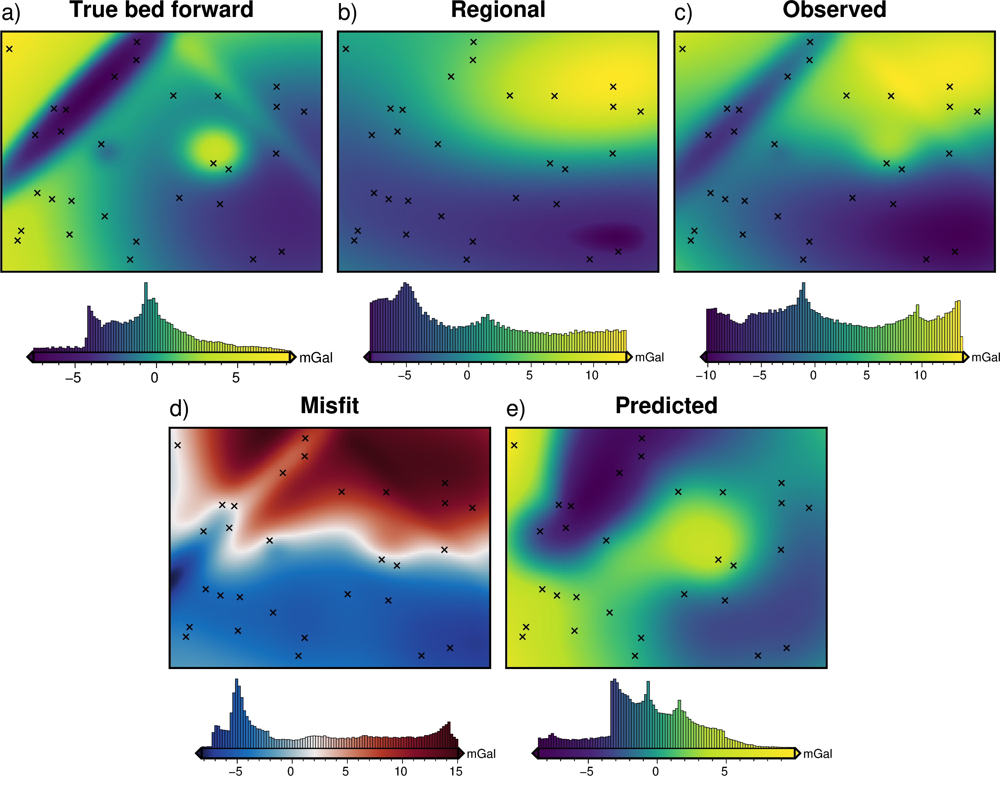

In [13]:
# # set color limits for each set of grids
# # lims = [utils.get_min_max(i, robust=True) for i in res_grids]
# # res_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# grav_ds = full_res_grav.set_index(["northing", "easting"]).to_xarray()

# titles = ["True bed forward", "Regional", "Observed", "Misfit", "Predicted"]
# grids = [grav_ds.Surface1, grav_ds.Surface2, grav_ds.Gobs_shift, grav_ds.misfit, grav_ds.layer1_forward]
# cmaps = ["viridis", "viridis", "viridis", "balance+h0", "viridis"]

# for i, g in enumerate(grids):
#     if i == 0:
#         fig = None
#         origin_shift = "initialize"
#         xshift_amount = None
#         yshift_amount = None
#     elif i == 3:
#         fig = fig
#         origin_shift = "both_shift"
#         xshift_amount = -1.5
#         yshift_amount = -1.1
#     else:
#         fig = fig
#         origin_shift = "xshift"
#         xshift_amount = 1
#         yshift_amount = 0
#     # else:
#     #     origin_shift = "xshift"

#     fig = maps.plot_grd(
#         grid=g,
#         fig_height=6,
#         cmap=cmaps[i],
#         robust=False,
#         region=inversion_region,
#         title=titles[i],
#         cbar_unit="mGal",
#         hist=True,
#         cbar_yoffset=2,
#         grd2cpt=True,
#         title_font="16p,Helvetica-Bold,black",
#         fig=fig,
#         origin_shift=origin_shift,
#         xshift_amount=xshift_amount,
#         yshift_amount=yshift_amount,
#         points=constraints.rename(columns={"easting":"x", "northing":"y"}),
#         points_style="x0.2c",
#         points_pen=".8p",
#     )
#     fig.text(
#         position="TL",
#         justify="BL",
#         text=f"{string.ascii_lowercase[i]})",
#         font="16p,Helvetica,black",
#         offset="j0/.3",
#         no_clip=True,
#     )
# fig.show()

In [14]:
# # plot Layer 1 forward grav
# fig = maps.plot_grd(
#     forward_grids.Surface1,
#     cmap="vik",
#     # cpt_lims=(zmin, zmax),
#     cbar_label="mGal",
#     title="True bathymetry forward gravity",
#     coast=False,
#     hist=True,
#     cbar_yoffset=3,
#     frame=["nSWe", "xaf10000", "yaf10000"],
# )
# # plot figure label "a"
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="26p,Helvetica,black",
#     offset="j0/.3",
#     no_clip=True,
# )

# # plot Layer 2 forward grav
# fig = maps.plot_grd(
#     forward_grids.Surface2,
#     cmap="vik",
#     # cpt_lims=(zmin, zmax),
#     cbar_label="mGal",
#     title="Regional gravity component",
#     coast=False,
#     hist=True,
#     cbar_yoffset=3,
#     frame=["nSwe", "xaf10000", "yaf10000"],
#     fig=fig,
#     origin_shift="xshift",
# )
# # plot figure label "b"
# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="26p,Helvetica,black",
#     offset="j0/.3",
#     no_clip=True,
# )

# # plot total forward grav
# fig = maps.plot_grd(
#     forward_grids.forward_total,
#     cmap="vik",
#     # cpt_lims=(zmin, zmax),
#     cbar_label="mGal",
#     title="Synthetic gravity",
#     coast=False,
#     hist=True,
#     cbar_yoffset=3,
#     frame=["nSwE", "xaf10000", "yaf10000"],
#     fig=fig,
#     origin_shift="xshift",
# )
# # plot figure label "c"
# fig.text(
#     position="TL",
#     justify="BL",
#     text="c)",
#     font="26p,Helvetica,black",
#     offset="j0/.3",
#     no_clip=True,
# )

# fig.show()

# Constraints grid

In [9]:
starting_prisms = copy.deepcopy(layer1_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist = layer_spacing/np.sqrt(2),
    low = 0,
    high = 1,
    # region=inversion_region,
)
starting_prisms["weights"] = min_dist
# starting_prisms.weights.plot()

# Regional - Residual seperation

Here we seperate the gravity misfit into `regional` and `residual` components. Since we created the synthetic model, we precisely know the regional component (the forward gravity of `Surface 2`), and can thus tune our regional-residual seperation method to accurately remove the regional field. 

In [15]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
# )

# # set comparison method
# # comparison_method='minimize_constraints'
# comparison_method = "regional_comparison"

# methods = ["filter", "trend", ] #"constraints"]#, "eq_sources"]

# for i in methods:
#     # set name and storage for the optimization
#     study_name = f"synthetic_simple_regional_sep_indiv_{i}_{comparison_method}"
#     fname = f"../../optimization_logs/{study_name}.log"

#     # remove if exists
#     for p in pathlib.Path(".").glob(f"{fname}*"):
#         pathlib.Path(p).unlink(missing_ok=True)

#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # set number of runs per method
#     n_trials=20

#     # create study
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="BoTorch")
#         study = optuna.create_study(
#             study_name=study_name,
#             storage=storage,
#             direction="minimize",
#             sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#             load_if_exists=True,
#             )

#     # define the objective function
#     objective = optimization.optimal_regional_params(
#         comparison_method = comparison_method,
#         regional_method = i,
#         filter_limits = [10e3, 500e3, 10e3], # 100 options
#         trend_limits = [1, 20, 1], # 20 options
#         constraints_limits = [0, 1, 0.01], # 101 options
#         eq_sources_limits = [10e3, 5000e3, 10e3], # 1000 options
#         **regional_kwargs)

#     # run the optimization
#     with inv_utils.HiddenPrints():
#         with warnings.catch_warnings():
#             warnings.simplefilter("ignore")
#             study, study_df = optimization.optuna_parallel(
#                 study_name=study_name,
#                 study_storage=storage,
#                 objective=objective,
#                 n_trials=n_trials,
#                 maximize_cpus=True,
#                 parallel=True,
#             )

# # load studies
# study_dfs = []
# for i in methods:
#     study_name = f"synthetic_simple_regional_sep_indiv_{i}_{comparison_method}"
#     fname = f"../../optimization_logs/{study_name}.log"

#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     study = optuna.load_study(storage=storage, study_name=study_name)
#     study_df = study.trials_dataframe()
#     study_dfs.append(study_df)

#     # plot results
#     # plotting.plot_best_param(
#     #     study_df, comparison_method, regional_method=i, **regional_kwargs
#     # )
#     # optuna.visualization.plot_slice(study).show()

In [16]:
# best_regional_kwargs = dict(
#     filter = dict(
#         regional_method="filter", filter=f"g{study_dfs[0].iloc[study_dfs[0].value.argmin()].params_filter}"),
#     trend = dict(
#         regional_method="trend", trend=int(study_dfs[1].iloc[study_dfs[1].value.argmin()].params_trend)),
# )
# best_regional_kwargs

{'filter': {'regional_method': 'filter', 'filter': 'g30000'},
 'trend': {'regional_method': 'trend', 'trend': 3}}

In [20]:
# for i in methods:
#     param = df[df[f"params_{i}"].notnull()].iloc[0][f"params_{i}"]

#     df_anomalies = regional.regional_seperation(
#         regional_method=i,
#         filter=f"g{param}",
#         trend=int(param),
#         fill_method="pygmt",
#         tension_factor=param,
#         eq_sources=param,
#         depth_type="relative",
#         eq_damping=None,
#         block_size=grav_spacing,
#         **regional_kwargs,
#     )

#     _ = utils.grd_compare(
#         regional_kwargs.get("true_regional"),
#         df_anomalies.set_index(["northing", "easting"]).to_xarray().reg,
#         grid1_name="True regional gravity",
#         grid2_name="Calculated regional gravity",
#         title=f"Method: {i}",
#         plot=True,
#         region=inversion_region,
#         plot_type="pygmt",
#         cmap="vik",
#         diff_cmap="vik+h0",
#         hist=True,
#         inset=False,
#         points_style="c.15c",
#         subplot_labels=True,
#         # robust=True,
#         robust=False,
#         verbose="q",
#         cbar_label="mGal",
#     )

## Optimize eq sources method

{'damping': 1.7238449106287765, 'depth': 89827.52006727958}


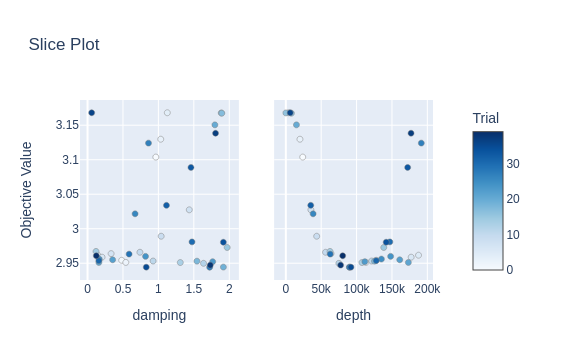

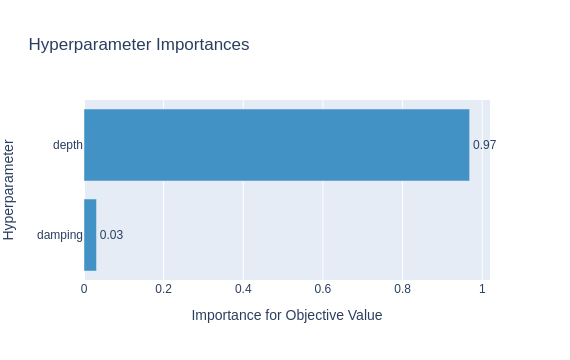

In [17]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
#     block_size=grav_spacing,
# )

# # set name and storage for the optimization
# study_name = f"synthetic_simple_regional_sep_indiv_eq_sources"
# fname = f"../../optimization_logs/{study_name}.log"

# with warnings.catch_warnings():
#     warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#     storage = JournalStorage(JournalFileStorage(fname))

# # remove if exists
# for p in pathlib.Path(".").glob(f"{fname}*"):
#     pathlib.Path(p).unlink(missing_ok=True)

# # set number of runs per method
# n_trials=40

# # create study
# with warnings.catch_warnings():
#     warnings.filterwarnings("ignore", message="BoTorch")
#     study = optuna.create_study(
#         study_name=study_name,
#         storage=storage,
#         direction="minimize",
#         sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#         load_if_exists=True,
#         )

# # define the objective function
# objective = optimization.optimal_regional_eq_sources_params(
#     # damping_limits = [10^-5, 2],
#     # depth_limits = [1, 1000e3],
#     damping_limits = [0, 2],
#     depth_limits = [1, 200e3],
#     **regional_kwargs)

# # run the optimization
# with inv_utils.HiddenPrints():
#     with warnings.catch_warnings():
#         warnings.simplefilter("ignore")
#         study, study_df = optimization.optuna_parallel(
#             study_name=study_name,
#             study_storage=storage,
#             objective=objective,
#             n_trials=n_trials,
#             maximize_cpus=True,
#             parallel=True,
#         )

# # load studies
# study = optuna.load_study(storage=storage, study_name=study_name)
# study_df = study.trials_dataframe()

# print(study.best_params)

# regional_kwargs["param"]=study.best_params["depth"]
# regional_kwargs["eq_damping"]=study.best_params["damping"]

# optuna.visualization.plot_slice(study).show()
# optuna.visualization.plot_param_importances(study).show()

# rmse, df_anomalies = inv_utils.regional_seperation_quality(
#     regional_method="eq_sources",
#     comparison_method="regional_comparison",
#     **regional_kwargs,
# )

# # anom_grids = plotting.anomalies_plotting(
# #     df_anomalies,
# #     region=regional_kwargs.get("inversion_region"),
# #     grav_spacing=regional_kwargs.get("grav_spacing"),
# #     title=f"Method: eq_sources, Optimization score: {round(rmse,2)} mGal",
# #     constraints=regional_kwargs.get("constraints"),
# #     input_forward_column=regional_kwargs.get("input_forward_column"),
# #     input_grav_column=regional_kwargs.get("input_grav_column"),
# # )

In [18]:
# best_regional_kwargs["eq_sources"] = dict(
#     regional_method="eq_sources",
#     eq_sources=study.best_params["depth"],
#     eq_damping=study.best_params["damping"],
#     block_size=grav_spacing,
# )
# best_regional_kwargs

{'filter': {'regional_method': 'filter', 'filter': 'g30000'},
 'trend': {'regional_method': 'trend', 'trend': 3},
 'eq_sources': {'regional_method': 'eq_sources',
  'eq_sources': 89827.52006727958,
  'eq_damping': 1.7238449106287765,
  'block_size': 1000.0}}

## Optimize constraints method
function `regional_seperation` already does a cross validation to find the optimal parameters if using Verde to grid. Use the below code to check the provided limits of dampings and mindists are suitable

In [19]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     constraints=constraints,
# )

# dampings = np.logspace(-8, -5, num=20)

# _ = regional.regional_seperation(
#     regional_method="constraints",
#     constraint_block_size=grav_spacing,
#     grid_method="verde",
#     dampings = dampings,
#     **regional_kwargs,
# )

Highest score: 0.9866389768978647
Best damping: 1.1288378916846883e-06


In [20]:
# best_regional_kwargs["constraints"] = dict(
#     regional_method="constraints",
#     grid_method="verde",
#     dampings = dampings,
#     constraint_block_size=grav_spacing,
# )
# best_regional_kwargs

{'filter': {'regional_method': 'filter', 'filter': 'g30000'},
 'trend': {'regional_method': 'trend', 'trend': 3},
 'eq_sources': {'regional_method': 'eq_sources',
  'eq_sources': 89827.52006727958,
  'eq_damping': 1.7238449106287765,
  'block_size': 1000.0},
 'constraints': {'regional_method': 'constraints',
  'grid_method': 'verde',
  'dampings': array([1.00000000e-08, 1.43844989e-08, 2.06913808e-08, 2.97635144e-08,
         4.28133240e-08, 6.15848211e-08, 8.85866790e-08, 1.27427499e-07,
         1.83298071e-07, 2.63665090e-07, 3.79269019e-07, 5.45559478e-07,
         7.84759970e-07, 1.12883789e-06, 1.62377674e-06, 2.33572147e-06,
         3.35981829e-06, 4.83293024e-06, 6.95192796e-06, 1.00000000e-05]),
  'constraint_block_size': 1000.0}}

## Save and load kwargs for each method of regional separation

In [25]:
# # remove if exists
# pathlib.Path("../../synthetic_data/best_regional_kwargs.pickle").unlink(
#     missing_ok=True
# )
# with open("../../synthetic_data/best_regional_kwargs.pickle", "wb") as f:
#     pickle.dump(best_regional_kwargs, f)

In [27]:
# with open("../../synthetic_data/best_regional_kwargs.pickle", 'rb') as f:
#     best_regional_kwargs = pickle.load(f)
# best_regional_kwargs

{'filter': {'regional_method': 'filter', 'filter': 'g30000'},
 'trend': {'regional_method': 'trend', 'trend': 3},
 'eq_sources': {'regional_method': 'eq_sources',
  'eq_sources': 89827.52006727958,
  'eq_damping': 1.7238449106287765,
  'block_size': 1000.0},
 'constraints': {'regional_method': 'constraints',
  'grid_method': 'verde',
  'dampings': array([1.00000000e-08, 1.43844989e-08, 2.06913808e-08, 2.97635144e-08,
         4.28133240e-08, 6.15848211e-08, 8.85866790e-08, 1.27427499e-07,
         1.83298071e-07, 2.63665090e-07, 3.79269019e-07, 5.45559478e-07,
         7.84759970e-07, 1.12883789e-06, 1.62377674e-06, 2.33572147e-06,
         3.35981829e-06, 4.83293024e-06, 6.95192796e-06, 1.00000000e-05]),
  'constraint_block_size': 1000.0}}

# Compare inversion RMSEs with best of each regional method

In [21]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
# )

# anom_dfs = []
# for i, (k,v) in enumerate(tqdm(best_regional_kwargs.items())):
#     print(k)
#     df = regional.regional_seperation(
#         **v,
#         **regional_kwargs,
#     )
#     anom_dfs.append(df)

# reg_grids = []
# res_grids = []
# for i in anom_dfs:
#     ds = i.set_index(["northing","easting"]).to_xarray()
#     reg_grids.append(ds.reg)
#     res_grids.append(ds.res)

  0%|          | 0/4 [00:00<?, ?it/s]

filter
trend
eq_sources
constraints
Highest score: 0.9866389768978647
Best damping: 1.1288378916846883e-06


In [ ]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# inversion_kwargs = dict(
#     input_grav_column="Gobs_shift",
#     max_iterations=100,
#     l2_norm_tolerance=0.15, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     inversion_region = inversion_region,
# )

# # set number of CV runs for each method
# n_trials = 10

# for i, (j,v) in enumerate(tqdm(best_regional_kwargs.items())):
#     # set name and storage for the optimization
#     study_name = f"synthetic_simple_regional_optimization_{j}"
#     fname = f"../../optimization_logs/{study_name}.log"
#     results_fname = f"../../synthetic_data/{study_name}"

#     #####
#     # Option 1: Run CV on each method
#     #####
#     # remove if exists
#     for p in pathlib.Path(".").glob(f"{fname}*"):
#         pathlib.Path(p).unlink(missing_ok=True)

#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # create study
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="BoTorch")
#         study = optuna.create_study(
#             study_name=study_name,
#             storage=storage,
#             direction="minimize",
#             sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#             load_if_exists=True,
#         )
#     # define the objective function
#     objective_func = optimization.CV_inversion(
#         training_data = anom_dfs[i][anom_dfs[i].test==False],
#         testing_data = anom_dfs[i][anom_dfs[i].test==True],
#         fname = results_fname,
#         starting_prisms = starting_prisms,
#         true_surface = layer1,
#         damping_limits = [-4, -1],  # damping = 10^damping_limit
#         damping_step = .1,
#         inversion_kwargs=inversion_kwargs,
#     )
#     # run the optimization
#     study, study_df = optimization.optuna_parallel(
#         study_name=study_name,
#         study_storage=storage,
#         objective = objective_func,
#         n_trials=n_trials,
#         maximize_cpus=True,
#         parallel=True,
#     )
#     #####
#     # end of option 1
#     #####
#     #####
#     # Option 2: Invert each method without using CV
#     #####
# #     # run best inversion for each method and save the prism_results df
# #     with inv_utils.HiddenPrints():
# #         rmse, prism_results, grav_results, params, elapsed_time, constraints_rmse  = inv.inversion_RMSE(
# #             input_grav=anom_dfs[i][anom_dfs[i].test==False],
# #             prism_layer = starting_prisms,
# #             true_surface = layer1,
# #             constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
# #             plot=False,
# #             solver_damping = 10**-2,
# #             l2_norm_tolerance=0.05,
# #             **inversion_kwargs,
# #         )

# #     results = dict(
# #             rmse = rmse,
# #             prism_results = prism_results,
# #             grav_results = grav_results,
# #             params = params,
# #             elapsed_time = elapsed_time,
# #             constraints_rmse = constraints_rmse,
# #         )
# #     #save results to pickle
# #     with open(f"{results_fname}_results.pickle", 'wb') as f:
# #         pickle.dump(results, f)
#     #####
#     # end of option 2
#     #####

  0%|          | 0/4 [00:00<?, ?it/s]

[I 2023-06-20 22:42:55,391] A new study created in Journal with name: synthetic_simple_regional_optimization_filter


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

[I 2023-06-20 22:51:00,773] A new study created in Journal with name: synthetic_simple_regional_optimization_trend


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

[I 2023-06-20 22:58:42,441] A new study created in Journal with name: synthetic_simple_regional_optimization_eq_sources


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

In [64]:
# final_surfaces = []
# difs = []
# prism_results = []
# grav_results = []
# inversion_results = []
# for i, (j,v) in enumerate(best_regional_kwargs.items()):
#     # set name and storage for the optimization
#     study_name = f"synthetic_simple_regional_optimization_{j}"
#     fname = f"../../optimization_logs/{study_name}.log"
#     results_fname = f"../../synthetic_data/{study_name}"

#     #####
#     # Option 1: use results from CV of each method
#     #####
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # load and plot past study
#     study = optuna.load_study(
#         study_name=study_name,
#         storage=storage,
#     )
#     print(study.best_params)
#     print(study.best_trial.number)

#     # load best inversion's results
#     with open(f"{results_fname}_trial_{study.best_trial.number}_results.pickle", 'rb') as f:
#         results = pickle.load(f)
#     #####
#     # end of option 1
#     #####
#     #####
#     # Option 2: use results from inversions with CV
#     #####
#     # load inversion's results
#     # with open(f"{results_fname}_results.pickle", 'rb') as f:
#     #     results = pickle.load(f)
#     #####
#     # end of option 2
#     #####
#     prism_ds = results["prism_results"].set_index(["northing", "easting"]).to_xarray()
#     cols = [s for s in results["prism_results"].columns.to_list() if "_layer" in s]
#     final_surface = prism_ds[cols[-1]]
#     dif = layer1 - final_surface

#     final_surfaces.append(final_surface)
#     prism_results.append(results["prism_results"])
#     grav_results.append(results["grav_results"])
#     difs.append(dif)
#     inversion_results.append(results)

{'damping': -2.4}
0
{'damping': -2.0999999999999996}
0
{'damping': -2.5999999999999996}
2
{'damping': -2.8}
4


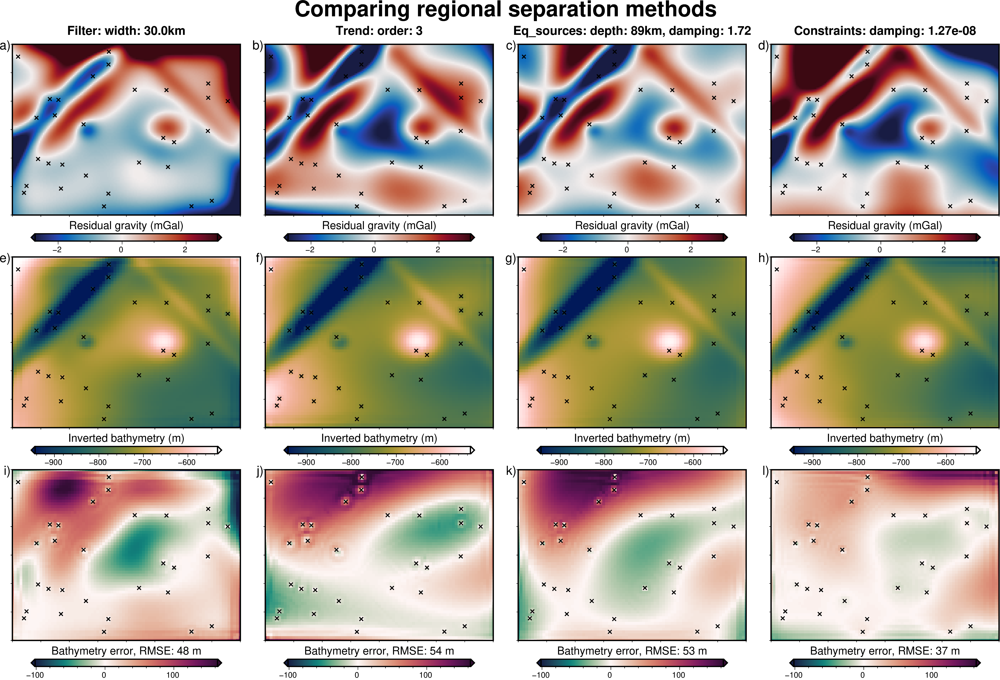

In [44]:
# # set color limits for each set of grids
# lims = [utils.get_min_max(i, robust=True) for i in res_grids]
# res_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# lims = [utils.get_min_max(i, robust=True) for i in final_surfaces]
# surface_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# lims = [utils.get_min_max(i, robust=True) for i in difs]
# dif_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# # set titles
# titles = []
# for i, (j,v) in enumerate(best_regional_kwargs.items()):
#     if j == "filter":
#         titles.append(f"{j.capitalize()}: width: {int(float(best_regional_kwargs['filter']['filter'][1:]))/1e3}km")
#     if j == "trend":
#         titles.append(f"{j.capitalize()}: order: {int(best_regional_kwargs['trend']['trend'])}")
#     if j == "eq_sources":
#         titles.append(
#             f"{j.capitalize()}: "
#             f"depth: {int(v['eq_sources']/1e3)}km, "
#             f"damping: {round(v['eq_damping'],2)}"
#         )
#     if j == "constraints":
#         titles.append(f"{j.capitalize()}: damping: 1.27e-08")

# # make subplot
# grids = res_grids + final_surfaces + difs
# fig = maps.subplots(
#     grids,
#     region = inversion_region,
#     dims = (3, len(inversion_results)),
#     fig_title = "Comparing regional separation methods",
#     subplot_titles = titles + [""]*8,
#     autolabel = "a)+JTL+o0.1c/-.3c",
#     fig_height = 10,
#     margins = [".4c", ".9c"],
    
#     cbar_labels = ["Residual gravity (mGal)" for x in inversion_results] + \
#         ["Inverted bathymetry (m)" for x in inversion_results] + \
#         [f"Bathymetry error, RMSE: {int(x['rmse'])} m" for x in inversion_results],
#     cmaps = ["balance+h0" for x in inversion_results] + \
#         ["batlowW" for x in inversion_results] + \
#         ["curl+h0" for x in inversion_results],
#     cpt_limits = [res_lims]*len(inversion_results) + \
#         [surface_lims]*len(inversion_results) + \
#         [dif_lims]*len(inversion_results),
#     cbar_text_location = "+ml",
#     cbar_yoffset = 1.1,
    
#     points = constraints.rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.3c",
#     points_pen = "1.5p",
# )
# fig.show()

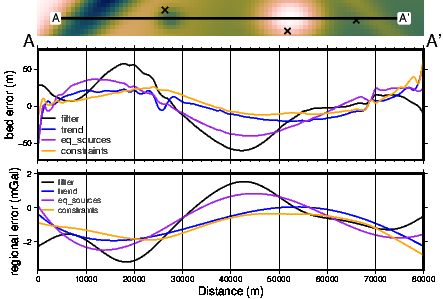

In [66]:
# plotting.plot_inversion_ensemble_results_profile(
#     prism_results,
#     grav_results,
#     input_forward_column="layer1_forward",
#     name_prefixes=[f"{k}," for k,v in best_regional_kwargs.items()],
#     constraints = constraints,
#     true_surface = layer1,
#     true_regional = full_res_grav.set_index(["northing","easting"]).to_xarray().Surface2,
#     start = [inversion_region[0], 30e3],
#     stop = [inversion_region[1], 30e3],
#     map_buffer = 0.05,
#     layers_legend_loc="jBL",
#     data_legend_loc="jTL",
# )

# Compare inversion RMSE's with gridding methods of constraints seperation

In [46]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
#     regional_method = "constraints"
# )

# # trial and compare different methods of the constraints techniquie
# constraint_args = [
#     dict(grid_method="pygmt", tension_factor=0),
#     dict(grid_method="pygmt", tension_factor=.25),
#     dict(grid_method="pygmt", tension_factor=1),
#     dict(grid_method="verde",
#         dampings = np.logspace(-9, -5, num=20),
#     )
# ]

# anom_dfs = []
# for i in constraint_args:
#     df = regional.regional_seperation(
#         **i,
#         **regional_kwargs,
#     )
#     anom_dfs.append(df)

# reg_grids = []
# res_grids = []
# for i in anom_dfs:
#     ds = i.set_index(["northing","easting"]).to_xarray()
#     reg_grids.append(ds.reg)
#     res_grids.append(ds.res)

# res_up_deriv_grids = [inv_utils.filter_grid(g, filt_type="up_deriv") for g in res_grids]

Highest score: 0.969541331411192
Best damping: 2.335721469090121e-06


In [50]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# inversion_kwargs = dict(
#     input_grav_column="Gobs_shift",
#     max_iterations=100,
#     l2_norm_tolerance=0.15, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     inversion_region = inversion_region,
# )

# # set number of CV runs for each method
# n_trials = 10

# for i, df in enumerate(tqdm(anom_dfs)):
#     # set name and storage for the optimization
#     study_name = f"synthetic_simple_regional_optimization_constraints_comparison_{i}"
#     fname = f"../../optimization_logs/{study_name}.log"
#     results_fname = f"../../synthetic_data/{study_name}"

#     #####
#     # Option 1: Run CV on each method
#     #####
#     # remove if exists
#     for p in pathlib.Path(".").glob(f"{fname}*"):
#         pathlib.Path(p).unlink(missing_ok=True)

#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # create study
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="BoTorch")
#         study = optuna.create_study(
#             study_name=study_name,
#             storage=storage,
#             direction="minimize",
#             sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#             load_if_exists=True,
#         )
#     # define the objective function
#     objective_func = optimization.CV_inversion(
#         training_data = df[df.test==False],
#         testing_data = df[df.test==True],
#         fname = results_fname,
#         starting_prisms = starting_prisms,
#         true_surface = layer1,
#         damping_limits = [-4, -1],  # damping = 10^damping_limit
#         damping_step = .1,
#         inversion_kwargs = inversion_kwargs,
#     )
#     # run the optimization
#     study, study_df = optimization.optuna_parallel(
#         study_name=study_name,
#         study_storage=storage,
#         objective = objective_func,
#         n_trials=n_trials,
#         maximize_cpus=True,
#         parallel=True,
#     )
#     #####
#     # end of option 1
#     #####
#     #####
#     # Option 2: Invert each method without using CV
#     #####
# #     # run best inversion for each method and save the prism_results df
# #     with inv_utils.HiddenPrints():
# #         rmse, prism_results, grav_results, params, elapsed_time, constraints_rmse  = inv.inversion_RMSE(
# #             input_grav = df[df.test==False],
# #             prism_layer = starting_prisms,
# #             true_surface = layer1,
# #             constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
# #             plot=False,
# #             solver_damping = 10**-2.6,
# #             l2_norm_tolerance=0.05,
# #             **inversion_kwargs,
# #         )

# #     results = dict(
# #             rmse = rmse,
# #             prism_results = prism_results,
# #             grav_results = grav_results,
# #             params = params,
# #             elapsed_time = elapsed_time,
# #             constraints_rmse = constraints_rmse,
# #         )
# #     #save results to pickle
# #     with open(f"{results_fname}_results.pickle", 'wb') as f:
# #         pickle.dump(results, f)
#     #####
#     # end of option 2
#     #####

  0%|          | 0/4 [00:00<?, ?it/s]

[I 2023-06-21 10:35:08,663] A new study created in Journal with name: synthetic_simple_regional_optimization_constraints_comparison_0


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

[I 2023-06-21 10:38:39,567] A new study created in Journal with name: synthetic_simple_regional_optimization_constraints_comparison_1


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

[I 2023-06-21 10:46:14,331] A new study created in Journal with name: synthetic_simple_regional_optimization_constraints_comparison_2


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

[I 2023-06-21 10:49:03,747] A new study created in Journal with name: synthetic_simple_regional_optimization_constraints_comparison_3


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

In [51]:
# final_surfaces = []
# difs = []
# prism_results = []
# grav_results = []
# inversion_results = []
# for i, df in enumerate(anom_dfs):
#     # set name and storage for the optimization
#     study_name = f"synthetic_simple_regional_optimization_constraints_comparison_{i}"
#     fname = f"../../optimization_logs/{study_name}.log"
#     results_fname = f"../../synthetic_data/{study_name}"

#     #####
#     # Option 1: use results from CV of each method
#     #####
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # load and plot past study
#     study = optuna.load_study(
#         study_name=study_name,
#         storage=storage,
#     )

#     # load best inversion's results
#     # if i == 0:
#     #     print("using second best trials for tension=0")
#     #     top_trials = study.trials_dataframe().sort_values(by="value")
#     #     # print(top_trials.head())
#     #     print(top_trials.iloc[1].params_damping, top_trials.iloc[1].params_l2_norm_tolerance)
#     #     print(top_trials.iloc[1].number)
#     #     with open(f"{results_fname}_trial_{top_trials.iloc[1].number}_results.pickle", 'rb') as f:
#     #         results = pickle.load(f)
#     # else:
#     #     print(study.best_params)
#     #     print(study.best_trial.number)
#     #     with open(f"{results_fname}_trial_{study.best_trial.number}_results.pickle", 'rb') as f:
#     #         results = pickle.load(f)
#     print(study.best_params)
#     print(study.best_trial.number)
#     with open(f"{results_fname}_trial_{study.best_trial.number}_results.pickle", 'rb') as f:
#         results = pickle.load(f)
#     #####
#     # end of option 1
#     #####
#     #####
#     # Option 2: use results from inversions with CV
#     #####
#     # # load inversion's results
#     # with open(f"{results_fname}_results.pickle", 'rb') as f:
#     #     results = pickle.load(f)
#     #####
#     # end of option 2
#     #####
#     prism_ds = results["prism_results"].set_index(["northing", "easting"]).to_xarray()
#     cols = [s for s in results["prism_results"].columns.to_list() if "_layer" in s]
#     final_surface = prism_ds[cols[-1]]
#     dif = layer1 - final_surface

#     final_surfaces.append(final_surface)
#     prism_results.append(results["prism_results"])
#     grav_results.append(results["grav_results"])
#     difs.append(dif)
#     inversion_results.append(results)

{'damping': -2.5999999999999996}
1
{'damping': -2.3}
2
{'damping': -2.5}
6
{'damping': -2.3}
1


In [52]:
# sampled_values = []
# for g in res_grids:
#     sampled = profile.sample_grids(
#         constraints,
#         grid = g,
#         name = "sampled",
#         coord_names=("easting", "northing"),
#     ).sampled
#     sampled_values.append(sampled)
# sampled_values = [inv_utils.RMSE(x) for x in sampled_values]
# sampled_values

[0.010530944024943978,
 0.05839274335621663,
 0.3693855041962706,
 0.05760219499680553]

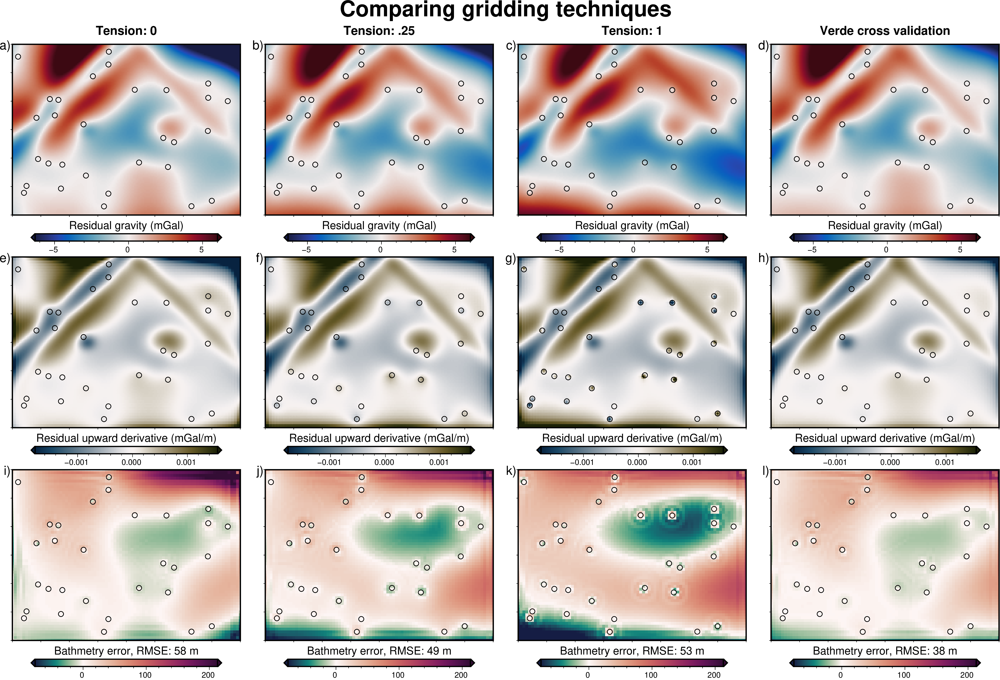

In [53]:
# # set color limits for each set of grids
# lims = [utils.get_min_max(i, robust=True) for i in res_grids]
# res_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# lims = [min([i[0] for i in lims]), max([i[1] for i in lims])]

# lims = [utils.get_min_max(i, robust=True) for i in res_up_deriv_grids]
# res_deriv_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# lims = [utils.get_min_max(i, robust=True) for i in difs]
# dif_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# # make subplot
# grids = res_grids + res_up_deriv_grids + difs

# fig = maps.subplots(
#     grids,
#     region = inversion_region,
#     dims = (3, len(inversion_results)),
#     fig_title = "Comparing gridding techniques",
#     subplot_titles = ["Tension: 0", "Tension: .25", "Tension: 1", "Verde cross validation"]\
#         + [""]*8,
#     autolabel = "a)+JTL+o0.1c/-.3c",
#     fig_height = 10,
#     margins = [".4c", ".9c"],
    
#     cbar_labels = ["Residual gravity (mGal)" for x in inversion_results] + \
#         ["Residual upward derivative (mGal/m)" for x in inversion_results] + \
#         [f"Bathmetry error, RMSE: {int(x['rmse'])} m" for x in inversion_results],
#     cmaps = ["balance+h0" for x in range(int((len(grids)+1)/3))] + \
#         ["diff+h0" for x in range(int((len(grids)+1)/3))] + \
#         ["curl+h0" for x in range(int((len(grids)+1)/3))],
#     cpt_limits = [res_lims]*len(inversion_results) + \
#         [res_deriv_lims]*len(inversion_results) + \
#         [dif_lims]*len(inversion_results),
#     cbar_text_location = "+ml",
#     cbar_yoffset = 1.1,
    
#     points = constraints.rename(columns={"easting":"x","northing":"y"}),
#     points_style = "c0.3c",
#     points_fill = None,
# )

# fig.show()

In [ ]:
# print(inversion_region)
# maps.plot_grd(layer1, region=[inversion_region[0], inversion_region[1], 20e3, 40e3],
#               points=constraints.rename(columns={"easting":"x","northing":"y"}))

In [ ]:
# subset = utils.points_inside_region(
#     constraints,
#     region = [inversion_region[0], inversion_region[1], 20e3, 40e3],
#     names = ["easting", "northing"],
#     ).rename(columns={"easting":"x","northing":"y"}
#     ).drop(columns="upward")
# subset = subset.append(pd.DataFrame({"x":[inversion_region[0],inversion_region[1]], "y":[30e3, 30e3]}))
# subset = subset.reset_index(drop=True).sort_values(by="x")
# subset

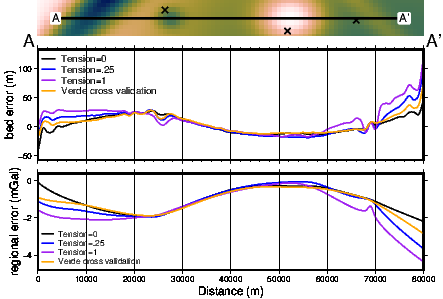

In [60]:
# plotting.plot_inversion_ensemble_results_profile(
#     prism_results,
#     grav_results,
#     input_forward_column="layer1_forward",
#     name_prefixes=["Tension=0,", "Tension=.25,", "Tension=1,", "Verde cross validation,"],
#     constraints = constraints,
#     true_surface = layer1,
#     true_regional = full_res_grav.set_index(["northing","easting"]).to_xarray().Surface2,
#     start = [inversion_region[0], 30e3],
#     stop = [inversion_region[1], 30e3],
#     map_buffer = 0.05,
#     layers_legend_loc="jTL",
#     data_legend_loc="jBL",
# )

In [ ]:
# plotting.plot_regional_gridding_ensemble_profile(
#     anom_dfs,
#     polyline = subset,
#     # start = [inversion_region[0], 30e3],
#     # stop = [inversion_region[1], 30e3],
#     name_prefixes=["Tension: 0", "Tension: .25", "Tension: 1", "Verde CV"],
#     constraints = constraints,
#     true_regional = full_res_grav.set_index(["northing","easting"]).to_xarray().Surface2,
#     map_buffer = 0.1,
#     layers_legend_loc="jBR",
#     data_legend_loc="jTR",
# )

In [ ]:
# grids = res_grids + res_up_deriv_grids
# fig = maps.subplots(
#     grids,
#     region = inversion_region,
#     dims = (2,4),
#     fig_title = "Comparing gridding techniques",
#     subplot_titles = [
#         "Tension: 0", "Tension: .25", "Tension: 1", "Verde cross validation",
#         "", "", "",""
#     ],
#     cbar_labels = ["residual gravity (mGal)" for x in range(int((len(grids)+1)/2))] + \
#         ["upward derivated" for x in range(int((len(grids)+1)/2))],
#     autolabel = True,
#     fig_height = 10,
#     margins = ".9c",
#     # grd2cpt=True,
#     cmaps = ["vik+h0" for x in range(len(grids))],
#     points = constraints.rename(columns={"easting":"x","northing":"y"}),
#     points_style = "c0.1c",
#     robust = True,
# )
# fig.show()

In [ ]:
# plotting.plot_regional_gridding_ensemble_profile(
#     grav_results,
#     name_prefixes=[i for i,j in enumerate(grav_results)],
#     constraints = constraints,
#     true_regional = full_res_grav.set_index(["northing","easting"]).to_xarray().Surface2,
#     start = [inversion_region[0], 30e3],
#     stop = [inversion_region[1], 30e3],
#     map_buffer = 0.1,
#     layers_legend_loc="jBR",
#     data_legend_loc="jTR",

#     layers_line_cmap = "viridis",
#     layers_color = df.cell_size.values,
#     data_cmap = "matter",
#     data_color = df.cell_size.values,
#     layers_legend = False,
#     data_legend = False,
# )

# Final Regional seperation 

Highest score: 0.9866343807047091
Best damping: 1.2742749857031322e-06


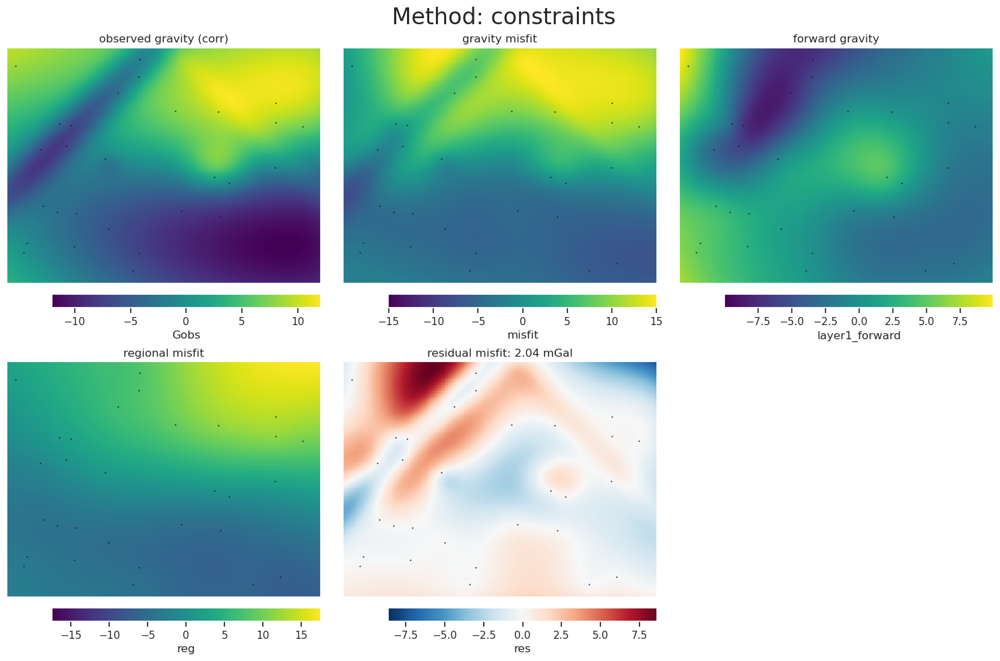

In [69]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
#     grid_method="verde",
#     dampings=np.logspace(-8, -4, num=20),
#     # dampings=np.logspace(-9, -6, num=20),
#     constraint_block_size=grav_spacing,
#     block_size=grav_spacing,
# )

# # choose the regional method:
# # regional_method = "filter"
# # regional_method = "trend"
# regional_method = "constraints"
# # regional_method = "eq_sources"

# df_anomalies = regional.regional_seperation(
#     regional_method=regional_method,
#     **regional_kwargs,
# )

# anom_grids = plotting.anomalies_plotting(
#     df_anomalies,
#     title=f" Method: {regional_method}",
#     constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs",
#     # plot_type="pygmt",
#     plot_type="xarray",
#     robust=False,
# )

# # _ = utils.grd_compare(
# #     regional_kwargs.get("true_regional"),
# #     df_anomalies.set_index(["northing","easting"]).to_xarray().reg,
# #     grid1_name="True regional gravity",
# #     grid2_name="Calculated regional gravity",
# #     title=f"Method: {regional_method}",
# #     plot=True,
# #     region=kwargs.get("inversion_region"),
# #     plot_type="pygmt",
# #     cmap="vik",
# #     diff_cmap="vik+h0",
# #     hist=True,
# #     inset=False,
# #     points_style="c.15c",
# #     subplot_labels=True,
# #     # robust=True,
# #     robust=False,
# #     verbose="q",
# #     cbar_label="mGal",
# # )

### Save and load results

In [70]:
# df_anomalies.to_csv(
#     "../../synthetic_data/simple_regional_gravity_anomalies.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )

In [71]:
# df_anomalies = pd.read_csv(
#     "../../synthetic_data/simple_regional_gravity_anomalies.csv.gz",
#     sep=",",
#     header="infer",
#     index_col=None,
#     compression="gzip",
# )

# df_anomalies

,northing,easting,Surface1,Surface2,Gobs,test,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,4.895946,-1.585934,3.310012,False,1000.0,7.336436,5.232072,-2.104363,-2.845434,0.741070
1,0.0,500.0,4.832540,-1.641775,3.190765,True,1000.0,7.196777,5.112826,-2.083951,-2.850092,0.766140
2,0.0,1000.0,4.764286,-1.697236,3.067050,False,1000.0,7.053205,4.989111,-2.064094,-2.855532,0.791439
3,0.0,1500.0,4.692135,-1.752310,2.939826,True,1000.0,6.907357,4.861886,-2.045471,-2.862895,0.817424
4,0.0,2000.0,4.616825,-1.806994,2.809832,False,1000.0,6.760484,4.731892,-2.028592,-2.871894,0.843302
...,...,...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,9.220126,False,1000.0,0.539365,11.142186,10.602822,17.449999,-6.847177
19477,60000.0,78500.0,0.821796,8.327652,9.149448,True,1000.0,0.610158,11.071509,10.461350,17.457707,-6.996357
19478,60000.0,79000.0,0.821311,8.246703,9.068014,False,1000.0,0.680730,10.990075,10.309345,17.464529,-7.155184
19479,60000.0,79500.0,0.820943,8.153546,8.974489,True,1000.0,0.750859,10.896550,10.145691,17.470365,-7.324674


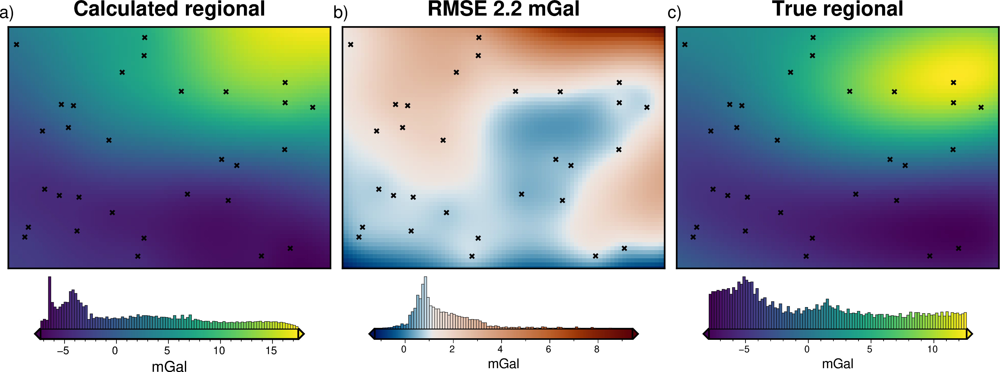

In [72]:
# ds = (
#     df_anomalies[df_anomalies.test == False]
#     .set_index(["northing", "easting"])
#     .to_xarray()
# )
# true_regional = ds.Surface2

# fig = maps.plot_grd(
#     ds.reg,
#     fig_height=8,
#     cmap="viridis",
#     title="Calculated regional",
#     cbar_label="mGal",
#     # frame=["nSWe", "xaf10000", "yaf10000"],
#     hist=True,
#     cbar_yoffset=2,
#     points=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
#     points_pen="1.5p",
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )

# dif = ds.reg - true_regional
# fig = maps.plot_grd(
#     dif,
#     cmap=f"vik+h{np.nanmedian(dif)}",
#     title=f"RMSE {round(inv_utils.RMSE(dif),1)} mGal",
#     cbar_label="mGal",
#     hist=True,
#     cbar_yoffset=2,
#     grd2_cpt=True,
#     fig=fig,
#     origin_shift="xshift",
#     points=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
#     points_pen="1.5p",
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )

# fig = maps.plot_grd(
#     true_regional,
#     cmap="viridis",
#     title="True regional",
#     cbar_label="mGal",
#     # frame=["nSwe", "xaf10000", "yaf10000"],
#     hist=True,
#     cbar_yoffset=2,
#     fig=fig,
#     origin_shift="xshift",
#     points=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
#     points_pen="1.5p",
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="c)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )

# fig.show()

# Inversion

Now that we have $G_{misfit}$, we can run an inversion to attempt to recover the true Layer 2 topography. Theres a number of parameters to choose from for the inversion.

In [31]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist#**.5

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.15, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     solver_damping = 10**-2,
#     plot_convergence=True,
# )

# df_anomalies = anom_dfs[-1]
# # with inv_utils.HiddenPrints():
# results = inv.inversion_RMSE(
#     input_grav=df_anomalies[df_anomalies.test==False],
#     inversion_region=inversion_region,
#     true_surface = layer1,
#     constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     plot=True,
#     plot_type="xarray",
#     robust=True,
#     **kwargs,
# )

# (
#     rmse,
#     prism_results,
#     grav_results,
#     params,
#     elapsed_time,
#     constraints_rmse,
# ) = results

# _ = plotting.plot_inversion_results(
#         grav_results,
#         prism_results,
#         params,
#         grav_region=inversion_region,
#         plot_iter_results=True,
#         plot_topo_results=True,
#         plot_grav_results=True,
#         iters_to_plot=4,
#         grav_spacing=grav_spacing,
#         constraints=constraints,
#     )

# print(f"RMSE: {rmse}")
# print(f"constraints RMSE: {constraints_rmse}")

In [ ]:
# plotting.plot_inversion_results_profile(
#     results[1],
#     results[2],
#     input_forward_column="layer1_forward",
#     constraints = constraints,
#     true_surface = layer1,
#     start = [inversion_region[0], 30e3],
#     stop = [inversion_region[1], 30e3],
#     map_buffer = 0.1,
#     legend_loc="JTR+jTR",
# )

## Full resolution grav, no noise

### Optimize only for damping

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]


Hyperparameter:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

Best score of 0.04441956038929188 with Hyperparameter=0.002154434690031882
Best score: 0.04441956038929188
Best damping: 0.002154434690031882


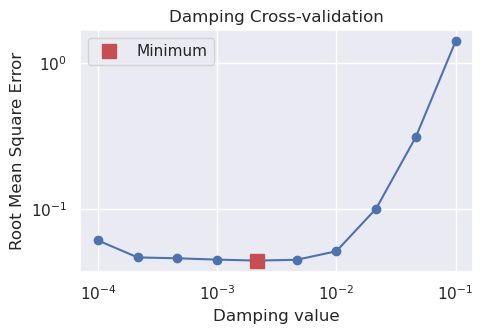

In [73]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist=layer_spacing / np.sqrt(2),
#     low=0,
#     high=1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving=True,
#     deriv_type="annulus",
#     solver_type="scipy least squares",
#     constraints=constraints,
# )

# fname = "../../synthetic_data/synthetic_simple_regional_damping_CV"

# dampings = np.logspace(-4, -1, 10)
# print(f"Damping values: {dampings}")

# scores, rmses = inv.inversion_optimal_parameters(
#     training_data= df_anomalies[df_anomalies.test==False],
#     testing_data = df_anomalies[df_anomalies.test==True],
#     parameter_values = dampings,
#     function = inv.inversion_damping_MSE,
#     plot = False,
#     plot_grids = False,
#     results_fname=fname,
#     progressbar=True,
#     true_surface=layer1,
#     inversion_region=inversion_region,
#     **kwargs,
# )

# # put scores and damping values into dict
# CV_results = dict(
#     scores=scores, dampings=dampings, rmses=rmses)

# # remove if exists
# pathlib.Path(fname).unlink(missing_ok=True)

# # save scores and dampings to pickle
# with open(f"{fname}.pickle", 'wb') as f:
#     pickle.dump(CV_results, f)

# # load scores and dampings from pickle
# with open(f"{fname}.pickle", "rb") as f:
#     CV_results = pickle.load(f)

# best = np.argmin(CV_results["scores"])
# print("Best score:", CV_results["scores"][best])
# print("Best damping:", CV_results["dampings"][best])

# # get best inversion result of each set
# with open(f"{fname}_trial_{best}.pickle", "rb") as f:
#     inv_result = pickle.load(f)

# # delete other results to save space
# fnames = []
# for i in range(len(dampings)):
#     if i == best:
#         pass
#     else:
#         fnames.append(f"{fname}_trial_{i}.pickle")
# for f in fnames:
#     pathlib.Path(f).unlink(missing_ok=True) 
    
# plotting.plot_parameter_cv(
#     CV_results["scores"],
#     CV_results["dampings"],
#     logx=True,
#     logy=True,
#     param_name="Damping",
# )

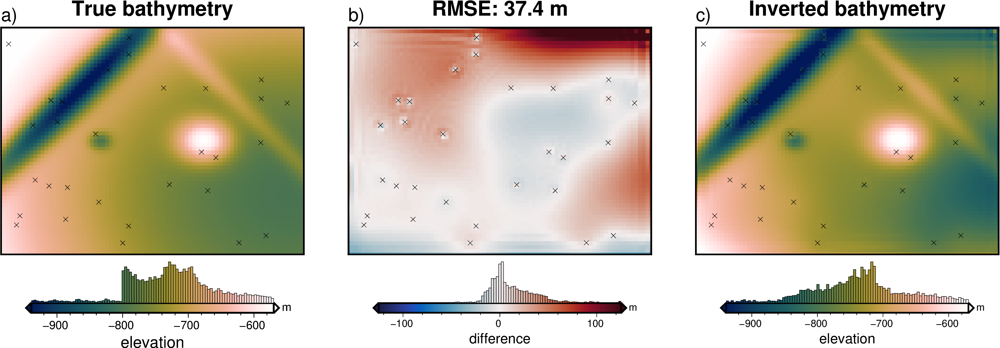

RMSE: 37.36470644512251
constraints RMSE: 2.49


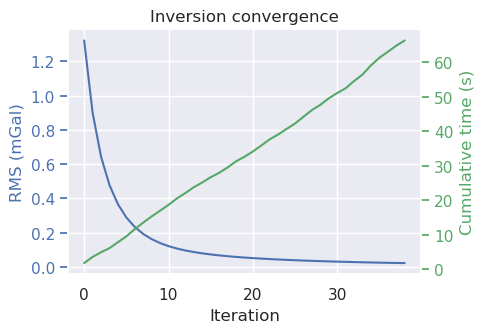

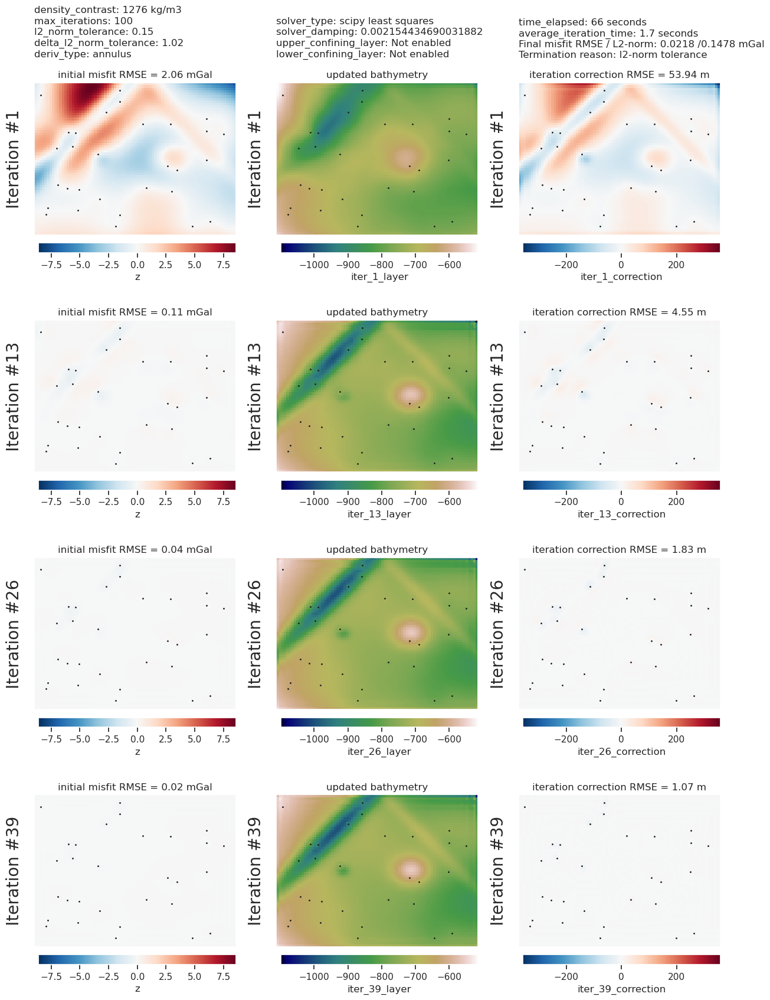

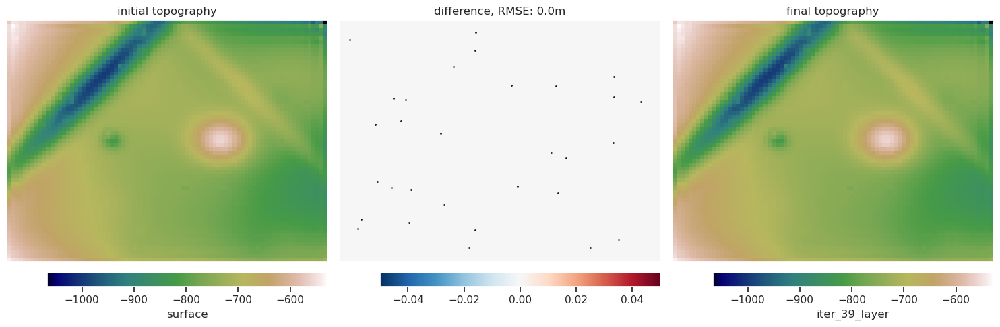

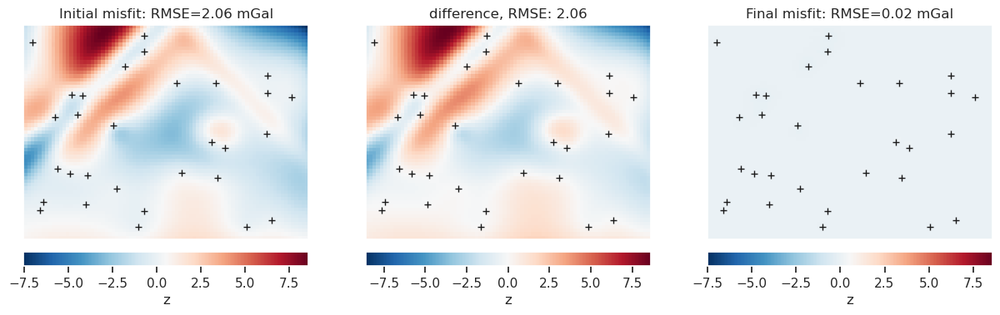

In [74]:
# with inv_utils.HiddenPrints():
#     _ = inv.inversion_RMSE(
#         results=inv_result,
#         input_grav=df_anomalies[df_anomalies.test == False],
#         inversion_region=inversion_region,
#         true_surface=layer1,
#         plot=True,
#         plot_type="pygmt",
#         xshift_amount=1.1,
#         label_offset="j0c/.2c",
#         # title_font = "16p,Helvetica-Bold,black",
#         robust=True,
#         **kwargs,
#     )

# plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

# _ = plotting.plot_inversion_results(
#     inv_result[2],
#     inv_result[1],
#     inv_result[3],
#     grav_region=inversion_region,
#     plot_iter_results=True,
#     plot_topo_results=True,
#     plot_grav_results=True,
#     iters_to_plot=4,
#     grav_spacing=grav_spacing,
#     constraints=constraints,
# )

# print(f"RMSE: {inv_result[0]}")
# print(f"constraints RMSE: {inv_result[-1]}")

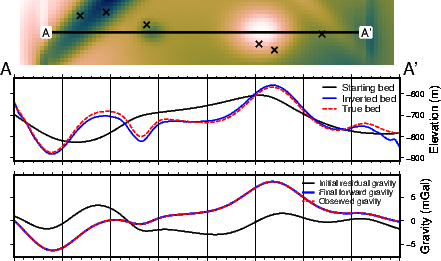

In [75]:
# plotting.plot_inversion_results_profile(
#     inv_result[1],
#     inv_result[2],
#     input_forward_column="layer1_forward",
#     constraints=constraints,
#     true_surface=layer1,
#     start=[inversion_region[0], 30e3],
#     stop=[inversion_region[1], 30e3],
#     map_buffer=0.1,
#     subplot_orientation="vertical",
#     data_legend_loc="jTR+o0c",
#     layers_legend_loc="jTR+o0c",
#     layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
#     data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
# )

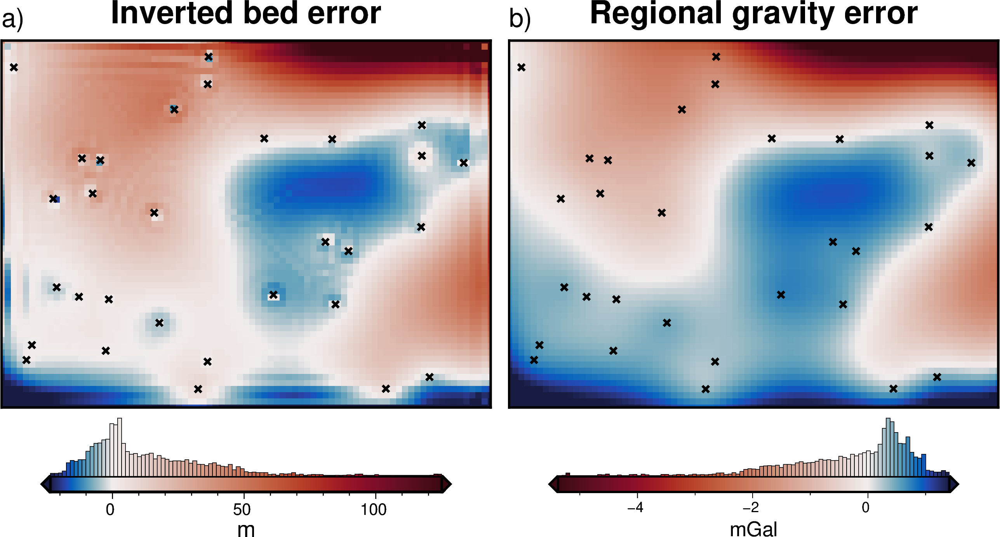

In [77]:
# # inverted bed error
# ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
# cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
# final_bed = ds[cols[-1]]

# final_bed = final_bed.sel(
#     easting=slice(inversion_region[0], inversion_region[1]),
#     northing=slice(inversion_region[2], inversion_region[3]),
# )
# true_bed = layer1.sel(
#     easting=slice(inversion_region[0], inversion_region[1]),
#     northing=slice(inversion_region[2], inversion_region[3]),
# )
# bed_dif = true_bed - final_bed

# # regional separation error
# ds = (
#     df_anomalies[df_anomalies.test == False]
#     .set_index(["northing", "easting"])
#     .to_xarray()
# )
# true_reg = ds.Surface2
# reg_dif = true_reg - ds.reg
# reg_dif -= np.nanmedian(reg_dif)


# fig = maps.plot_grd(
#     bed_dif,
#     fig_height=8,
#     title="Inverted bed error",
#     hist=True,
#     points=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
#     points_pen="1.5p",
#     cmap="balance+h0",
#     cbar_label="m",
#     cbar_yoffset=1.5,
#     robust=True,
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="16p,Helvetica,black",
#     offset="j0c/.3",
#     no_clip=True,
# )
# fig = maps.plot_grd(
#     reg_dif,
#     title="Regional gravity error",
#     cmap=f"balance+h0",
#     reverse_cpt=True,
#     fig=fig,
#     hist=True,
#     points=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
#     points_pen="1.5p",
#     origin_shift="xshift",
#     cbar_label="mGal",
#     cbar_yoffset=1.5,
#     robust=True,
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="16p,Helvetica,black",
#     offset="j0c/.3",
#     no_clip=True,
# )
# fig.show()

## Full resolution grav with noise

The above inversion was able to fully recover Layer 2. This is expected, since there was no noise in the data, and we used a very simple 2 layer model to create the observed gravity. Next we add 2% gaussian noise to $G_{misfit}$ to see how the inversion performs.

Standard deviation used for noise: [0.24103371167929646]
DC shifted observed gravity by -2.1mGal to match forward gravity.
method: constraints, parameter: 0.25
Highest score: 0.9866424235346625
Best damping: 1.438449888287663e-06


,northing,easting,Surface1,Surface2,Gobs,test,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,4.895946,-1.585934,3.736310,False,1000.0,7.336436,5.836312,-1.500124,-2.883035,1.382911
1,0.0,500.0,4.832540,-1.641775,3.288318,True,1000.0,7.196777,5.388320,-1.808457,-2.887308,1.078851
2,0.0,1000.0,4.764286,-1.697236,3.304061,False,1000.0,7.053205,5.404063,-1.649142,-2.892296,1.243154
3,0.0,1500.0,4.692135,-1.752310,3.481059,True,1000.0,6.907357,5.581060,-1.326297,-2.899048,1.572750
4,0.0,2000.0,4.616825,-1.806994,3.261078,False,1000.0,6.760484,5.361080,-1.399404,-2.907277,1.507873
...,...,...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,8.948735,False,1000.0,0.539365,11.048737,10.509372,17.189358,-6.679986
19477,60000.0,78500.0,0.821796,8.327652,9.297307,True,1000.0,0.610158,11.397308,10.787150,17.190151,-6.403001
19478,60000.0,79000.0,0.821311,8.246703,9.172418,False,1000.0,0.680730,11.272419,10.591689,17.190182,-6.598493
19479,60000.0,79500.0,0.820943,8.153546,9.187471,True,1000.0,0.750859,11.287472,10.536613,17.189360,-6.652747


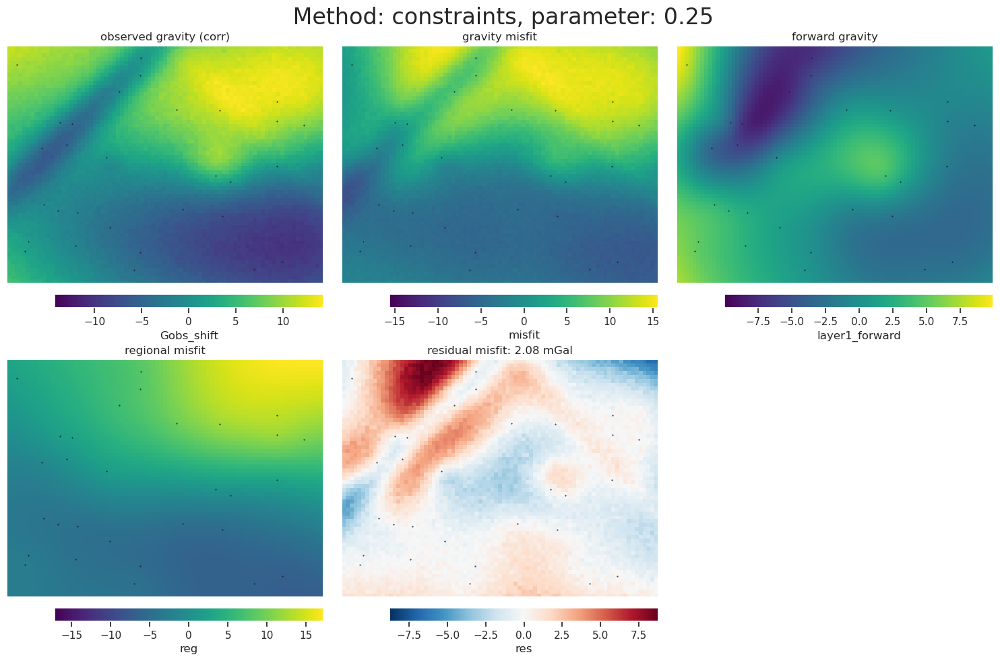

In [88]:
# # contaminate with noise
# full_res_grav_noise = full_res_grav.copy()
# full_res_grav_noise["Gobs"] = synthetic.contaminate(
#     full_res_grav_noise.Gobs,
#     stddev=0.02,
#     percent=True,
#     seed=0,
# )
# full_res_grav_noise = inv.misfit(
#     input_grav=full_res_grav_noise,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs",
#     constraints=constraints,
# )

# regional_kwargs = dict(
#     input_grav=full_res_grav_noise,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
#     grid_method="verde",
#     dampings=np.logspace(-9, -4, num=20),
#     constraint_block_size=grav_spacing,
# )

# # choose the regional method:
# # regional_method = "filter"
# # regional_method = "trend"
# regional_method = "constraints"
# # regional_method = "eq_sources"

# # set the parameter:
# param = 0.25

# print(f"method: {regional_method}, parameter: {param}")

# df_anomalies_noise = regional.regional_seperation(
#     regional_method=regional_method,
#     filter=f"g{param}",
#     trend=int(param),
#     fill_method="pygmt",
#     tension_factor=param,
#     eq_sources=param,
#     depth_type="relative",
#     eq_damping=None,
#     block_size=grav_spacing,
#     **regional_kwargs,
# )

# anom_grids = plotting.anomalies_plotting(
#     df_anomalies_noise[df_anomalies_noise.test == False],
#     title=f" Method: {regional_method}, parameter: {param}",
#     constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     # plot_type="pygmt",
#     plot_type="xarray",
#     robust=False,
# )

# df_anomalies_noise

### Save and load results

In [89]:
# df_anomalies_noise.to_csv(
#     "../../synthetic_data/simple_regional_noise_gravity_anomalies.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )

In [90]:
# df_anomalies_noise = pd.read_csv(
#     "../../synthetic_data/simple_regional_noise_gravity_anomalies.csv.gz",
#     sep=",",
#     header="infer",
#     index_col=None,
#     compression="gzip",
# )
# df_anomalies_noise

,northing,easting,Surface1,Surface2,Gobs,test,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,4.895946,-1.585934,3.736310,False,1000.0,7.336436,5.836312,-1.500124,-2.883035,1.382911
1,0.0,500.0,4.832540,-1.641775,3.288318,True,1000.0,7.196777,5.388320,-1.808457,-2.887308,1.078851
2,0.0,1000.0,4.764286,-1.697236,3.304061,False,1000.0,7.053205,5.404063,-1.649142,-2.892296,1.243154
3,0.0,1500.0,4.692135,-1.752310,3.481059,True,1000.0,6.907357,5.581060,-1.326297,-2.899048,1.572750
4,0.0,2000.0,4.616825,-1.806994,3.261078,False,1000.0,6.760484,5.361080,-1.399404,-2.907277,1.507873
...,...,...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,8.948735,False,1000.0,0.539365,11.048737,10.509372,17.189358,-6.679986
19477,60000.0,78500.0,0.821796,8.327652,9.297307,True,1000.0,0.610158,11.397308,10.787150,17.190151,-6.403001
19478,60000.0,79000.0,0.821311,8.246703,9.172418,False,1000.0,0.680730,11.272419,10.591689,17.190182,-6.598493
19479,60000.0,79500.0,0.820943,8.153546,9.187471,True,1000.0,0.750859,11.287472,10.536613,17.189360,-6.652747


In [119]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# weights, min_dist = inv_utils.constraints_grid(
#     constraints,
#     starting_prisms,
#     inner_bound=layer_spacing,
#     outer_bound=layer_spacing*2,
#     low=0,
#     high=1,
#     # region=inversion_region, # causes edge effects if provided
#     interp_type="spline",
# )
# starting_prisms["weights"] = weights
# starting_prisms["min_dist"] = min_dist

# # min_dist = inv_utils.normalized_mindist(
# #     constraints,
# #     starting_prisms,
# #     mindist = layer_spacing/np.sqrt(2),
# #     low = 0,
# #     high = 1,
# #     # region=inversion_region,
# # )
# # starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.48, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     solver_damping =  0.00464158,
#     plot_convergence=True,
# )

# # with inv_utils.HiddenPrints():
# results = inv.inversion_RMSE(
#     input_grav=df_anomalies_noise[df_anomalies_noise.test==False],
#     inversion_region=inversion_region,
#     true_surface = layer1,
#     constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     plot=True,
#     plot_type="xarray",
#     # robust=True,
#     **kwargs,
# )

# (
#     rmse,
#     prism_results,
#     grav_results,
#     params,
#     elapsed_time,
#     constraints_rmse,
# ) = results

# _ = plotting.plot_inversion_results(
#         grav_results,
#         prism_results,
#         params,
#         grav_region=inversion_region,
#         plot_iter_results=True,
#         plot_topo_results=True,
#         plot_grav_results=True,
#         iters_to_plot=4,
#         grav_spacing=grav_spacing,
#         constraints=constraints,
#     )

# print(f"RMSE: {rmse}")
# print(f"constraints RMSE: {constraints_rmse}")

In [120]:
# plotting.plot_inversion_results_profile(
#     results[1],
#     results[2],
#     input_forward_column="layer1_forward",
#     constraints = constraints,
#     true_surface = layer1,
#     start = [inversion_region[0], 30e3],
#     stop = [inversion_region[1], 30e3],
#     map_buffer = 0.1,
#     legend_loc="JTR+jTR",
# )

### Optimize only for damping

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]


Hyperparameter:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

Best score of 0.2800768573991069 with Hyperparameter=0.004641588833612777
Best score: 0.2800768573991069
Best damping: 0.004641588833612777


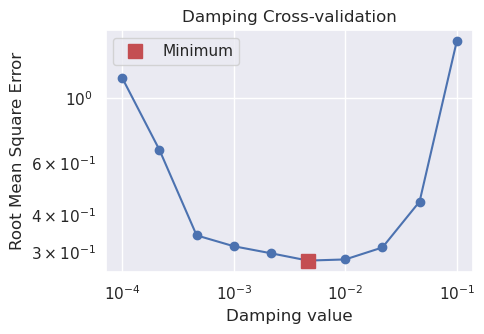

In [91]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist=layer_spacing / np.sqrt(2),
#     low=0,
#     high=1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.48,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving=True,
#     deriv_type="annulus",
#     solver_type="scipy least squares",
#     constraints=constraints,
# )

# fname = "../../synthetic_data/synthetic_simple_regional_noise_damping_CV"

# dampings = np.logspace(-4, -1, 10)
# print(f"Damping values: {dampings}")

# scores, rmses = inv.inversion_optimal_parameters(
#     training_data= df_anomalies_noise[df_anomalies_noise.test==False],
#     testing_data = df_anomalies_noise[df_anomalies_noise.test==True],
#     parameter_values = dampings,
#     function = inv.inversion_damping_MSE,
#     plot = False,
#     plot_grids = False,
#     results_fname=fname,
#     progressbar=True,
#     true_surface=layer1,
#     inversion_region=inversion_region,
#     **kwargs,
# )

# # put scores and damping values into dict
# CV_results = dict(
#     scores=scores, dampings=dampings, rmses=rmses)

# # remove if exists
# pathlib.Path(fname).unlink(missing_ok=True)

# # save scores and dampings to pickle
# with open(f"{fname}.pickle", 'wb') as f:
#     pickle.dump(CV_results, f)

# # load scores and dampings from pickle
# with open(f"{fname}.pickle", "rb") as f:
#     CV_results = pickle.load(f)

# best = np.argmin(CV_results["scores"])
# print("Best score:", CV_results["scores"][best])
# print("Best damping:", CV_results["dampings"][best])

# # get best inversion result of each set
# with open(f"{fname}_trial_{best}.pickle", "rb") as f:
#     inv_result = pickle.load(f)

# # delete other results to save space
# fnames = []
# for i in range(len(dampings)):
#     if i == best:
#         pass
#     else:
#         fnames.append(f"{fname}_trial_{i}.pickle")
# for f in fnames:
#     pathlib.Path(f).unlink(missing_ok=True) 

# plotting.plot_parameter_cv(
#     CV_results["scores"],
#     CV_results["dampings"],
#     logx=True,
#     logy=True,
#     param_name="Damping",
# )

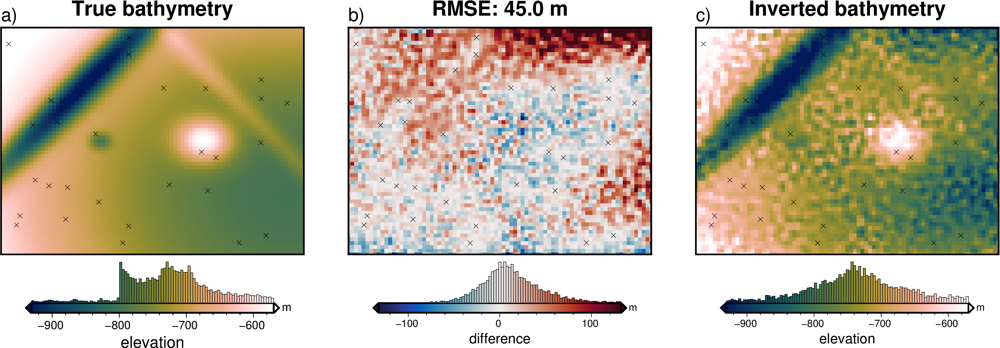

RMSE: 45.012288276484504
constraints RMSE: 1.55


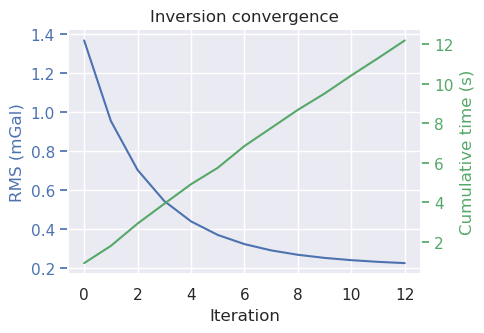

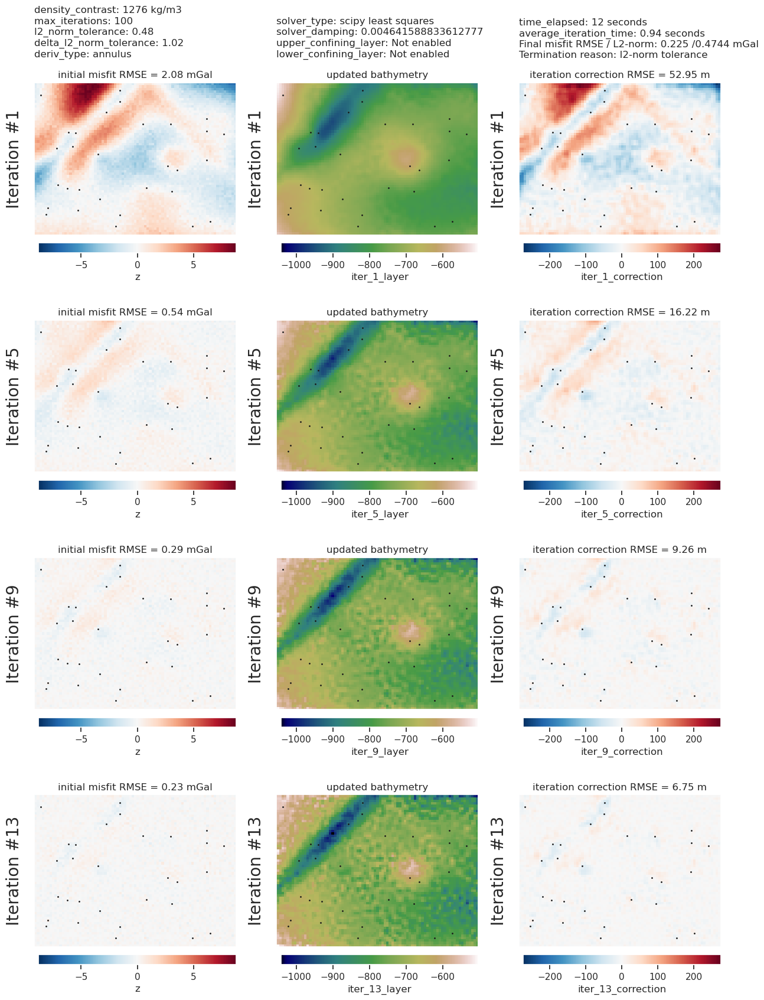

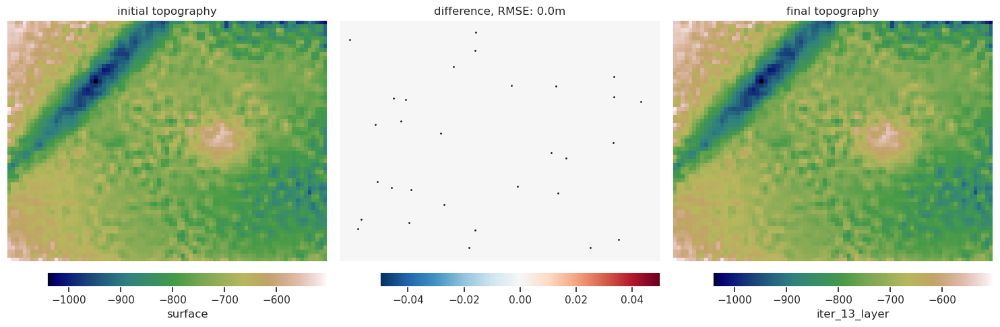

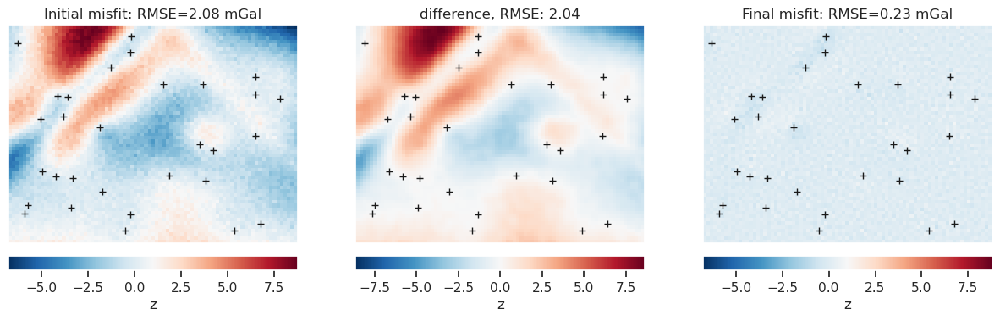

In [92]:
# with inv_utils.HiddenPrints():
#     _ = inv.inversion_RMSE(
#         results=inv_result,
#         input_grav=df_anomalies_noise[df_anomalies_noise.test == False],
#         inversion_region=inversion_region,
#         true_surface=layer1,
#         plot=True,
#         plot_type="pygmt",
#         xshift_amount=1.1,
#         label_offset="j0c/.2c",
#         # title_font = "16p,Helvetica-Bold,black",
#         robust=True,
#         **kwargs,
#     )

# plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

# _ = plotting.plot_inversion_results(
#     inv_result[2],
#     inv_result[1],
#     inv_result[3],
#     grav_region=inversion_region,
#     plot_iter_results=True,
#     plot_topo_results=True,
#     plot_grav_results=True,
#     iters_to_plot=4,
#     grav_spacing=grav_spacing,
#     constraints=constraints,
# )

# print(f"RMSE: {inv_result[0]}")
# print(f"constraints RMSE: {inv_result[-1]}")

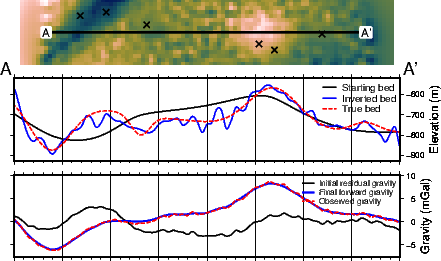

In [93]:
# plotting.plot_inversion_results_profile(
#     inv_result[1],
#     inv_result[2],
#     input_forward_column="layer1_forward",
#     constraints=constraints,
#     true_surface=layer1,
#     start=[inversion_region[0], 30e3],
#     stop=[inversion_region[1], 30e3],
#     map_buffer=0.1,
#     subplot_orientation="vertical",
#     data_legend_loc="jTR+o0c",
#     layers_legend_loc="jTR+o0c",
#     layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
#     data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
# )

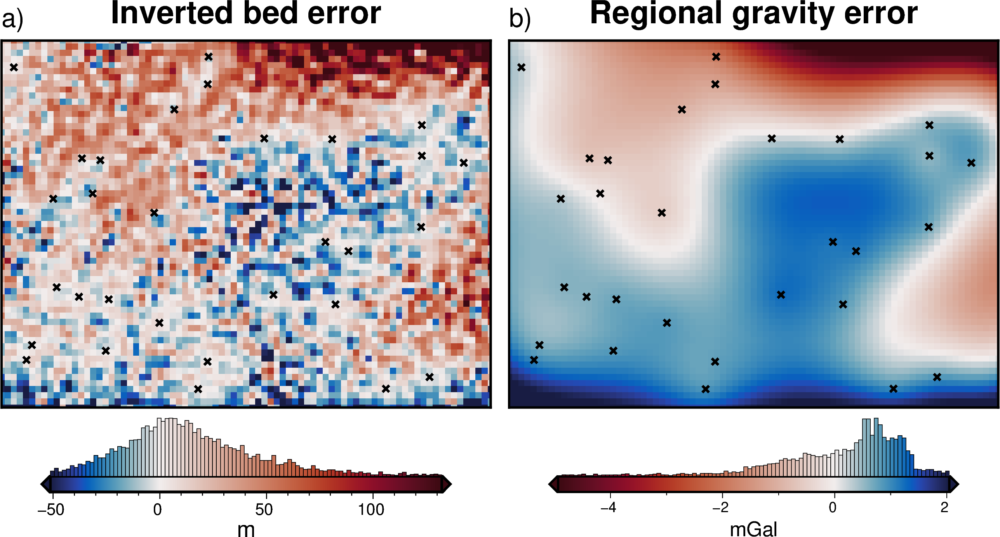

In [94]:
# # # inverted bed error
# ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
# cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
# final_bed = ds[cols[-1]]

# final_bed = final_bed.sel(
#     easting=slice(inversion_region[0], inversion_region[1]),
#     northing=slice(inversion_region[2], inversion_region[3]),
# )
# true_bed = layer1.sel(
#     easting=slice(inversion_region[0], inversion_region[1]),
#     northing=slice(inversion_region[2], inversion_region[3]),
# )
# bed_dif = true_bed - final_bed

# # regional separation error
# ds = (
#     df_anomalies_noise[df_anomalies_noise.test == False]
#     .set_index(["northing", "easting"])
#     .to_xarray()
# )
# true_reg = ds.Surface2
# reg_dif = true_reg - ds.reg
# reg_dif -= np.nanmean(reg_dif)

# fig = maps.plot_grd(
#     bed_dif,
#     fig_height=8,
#     title="Inverted bed error",
#     hist=True,
#     points=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
#     points_pen="1.5p",
#     cmap="balance+h0",
#     cbar_label="m",
#     cbar_yoffset=1.5,
#     robust=True,
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="16p,Helvetica,black",
#     offset="j0c/.3",
#     no_clip=True,
# )
# fig = maps.plot_grd(
#     reg_dif,
#     title="Regional gravity error",
#     cmap=f"balance+h0",
#     reverse_cpt=True,
#     fig=fig,
#     hist=True,
#     points=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
#     points_pen="1.5p",
#     origin_shift="xshift",
#     cbar_label="mGal",
#     cbar_yoffset=1.5,
#     robust=True,
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="16p,Helvetica,black",
#     offset="j0c/.3",
#     no_clip=True,
# )
# fig.show()

## Sampled grav, no noise

[1e-10, 3.593813663804626e-10, 1.2915496650148826e-09, 4.641588833612773e-09, 1.6681005372000592e-08, 5.99484250318941e-08, 2.1544346900318867e-07, 7.742636826811278e-07, 2.782559402207126e-06, 1e-05, 3.5938136638046256e-05, 0.00012915496650148855, 0.0004641588833612782, 0.0016681005372000592, 0.005994842503189421, 0.021544346900318867, 0.07742636826811278, 0.2782559402207126, 1.0, None]
[1.00000000e+00 2.63252632e+03 5.26405263e+03 7.89557895e+03
 1.05271053e+04 1.31586316e+04 1.57901579e+04 1.84216842e+04
 2.10532105e+04 2.36847368e+04 2.63162632e+04 2.89477895e+04
 3.15793158e+04 3.42108421e+04 3.68423684e+04 3.94738947e+04
 4.21054211e+04 4.47369474e+04 4.73684737e+04 5.00000000e+04]


Parameters:   0%|          | 0/400 [00:00<?, ?it/s]

Best score: 0.9994898716285832
Best parameters: {'damping': 2.1544346900318867e-07, 'depth': 13158.631578947368}
14540
4941
DC shifted observed gravity by -1.92mGal to match forward gravity.


,northing,easting,test,Gobs,upward,layer1_forward,Gobs_shift,misfit
0,0.0,0.0,False,3.309742,1000.0,7.336436,5.229119,-2.107317
1,0.0,500.0,True,3.198930,1000.0,7.196777,5.118307,-2.078470
2,0.0,1000.0,False,3.080190,1000.0,7.053205,4.999567,-2.053638
3,0.0,1500.0,True,2.954809,1000.0,6.907357,4.874186,-2.033172
4,0.0,2000.0,False,2.824110,1000.0,6.760484,4.743487,-2.016997
...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,False,9.208997,1000.0,0.539365,11.128373,10.589009
19477,60000.0,78500.0,True,9.135542,1000.0,0.610158,11.054919,10.444761
19478,60000.0,79000.0,False,9.053732,1000.0,0.680730,10.973109,10.292378
19479,60000.0,79500.0,True,8.963743,1000.0,0.750859,10.883120,10.132261


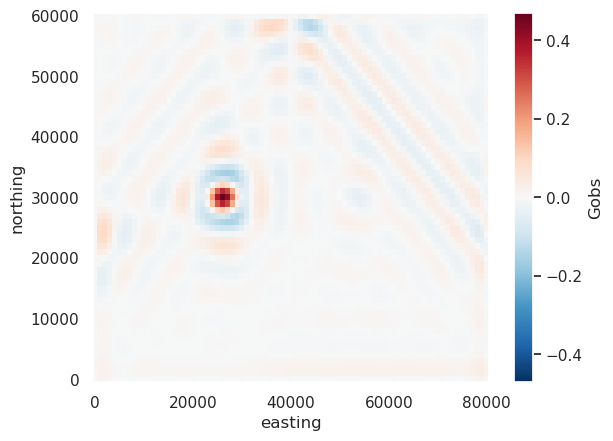

In [95]:
# # parameter values, if using grid search
# num = 20
# dampings = list(np.logspace(-10, 0, num=num-1))
# dampings.append(None)
# depths = np.linspace(1, 50e3, num)

# # parameter ranges, if using optimization
# # dampings = [10**-5, 2]
# # depths = [1, 50e3]

# # set new spatial resolution of training points
# sampled_spacing = 4e3

# # sample gravity at low resolution grid, regrid at full res with eq sources
# sampled_grav, score = inv_utils.resample_gravity_with_test_points(
#     grav_df=full_res_grav,
#     grav_column="Gobs",
#     coord_columns=["easting", "northing", "upward"],
#     starting_training_spacing=layer_spacing,
#     coarse_training_spacing=sampled_spacing,
#     region=inversion_region,
#     dampings=dampings,
#     depths=depths,
#     optimization = False,
#     # optimization=True,
#     n_trials=20,
#     plot=True,
#     # log_fname="../tmp_outputs/tmp",
# )
# print(len(sampled_grav[sampled_grav.test]))
# print(len(sampled_grav[sampled_grav.test == False]))

# # add layer1 starting forward grav into df
# sampled_grav["layer1_forward"] = full_res_grav.layer1_forward

# # recalculate misfit
# sampled_grav = inv.misfit(
#     input_grav=sampled_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs",
#     constraints=constraints,
# )

# sampled_grav

Highest score: 0.9865795738176562
Best damping: 1e-06


/Users/home/tankerma/RIS_gravity_inversion/RIS_gravity_inversion/utils.py:175: UserWarning:




,northing,easting,test,Gobs,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,False,3.309742,1000.0,7.336436,5.229119,-2.107317,-2.812369,0.705053
1,0.0,500.0,True,3.198930,1000.0,7.196777,5.118307,-2.078470,-2.817320,0.738850
2,0.0,1000.0,False,3.080190,1000.0,7.053205,4.999567,-2.053638,-2.823066,0.769428
3,0.0,1500.0,True,2.954809,1000.0,6.907357,4.874186,-2.033172,-2.830761,0.797589
4,0.0,2000.0,False,2.824110,1000.0,6.760484,4.743487,-2.016997,-2.840118,0.823121
...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,False,9.208997,1000.0,0.539365,11.128373,10.589009,17.459764,-6.870756
19477,60000.0,78500.0,True,9.135542,1000.0,0.610158,11.054919,10.444761,17.467635,-7.022874
19478,60000.0,79000.0,False,9.053732,1000.0,0.680730,10.973109,10.292378,17.474649,-7.182271
19479,60000.0,79500.0,True,8.963743,1000.0,0.750859,10.883120,10.132261,17.480713,-7.348452


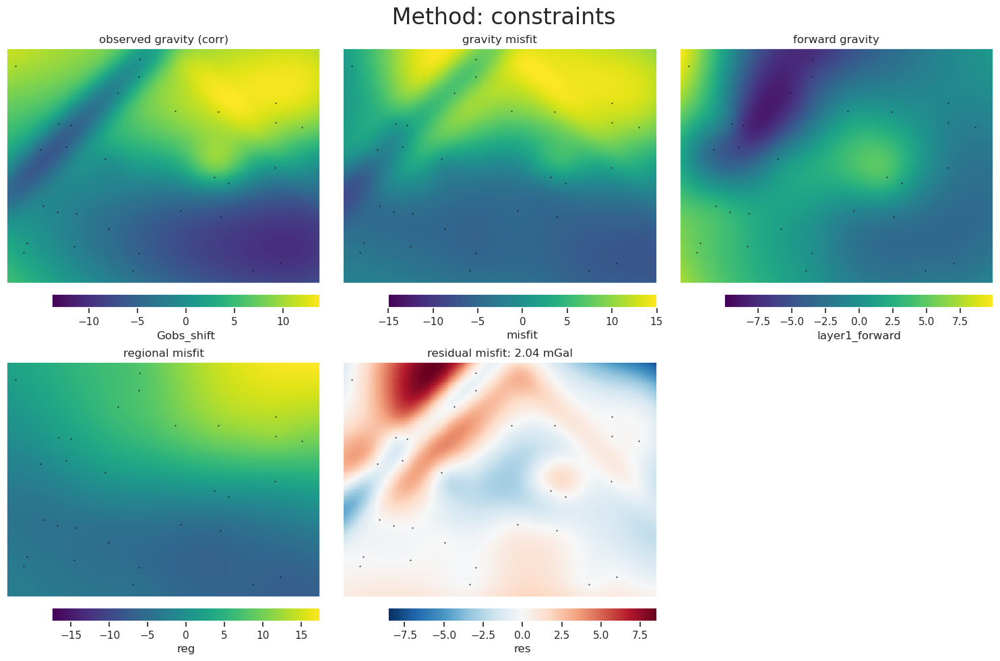

In [96]:
# # resample to desired spacing
# # sampled_spacing = 4e3
# # sampled_grav = inv_utils.resample_with_test_points(
# #     sampled_spacing,
# #     full_res_grav,
# #     inversion_region,
# # )
# regional_kwargs = dict(
#     input_grav=sampled_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
#     grid_method="verde",
#     # dampings=np.logspace(-8, -6, num=20),
#     dampings=np.logspace(-9, -6, num=20),
#     constraint_block_size=grav_spacing,
#     block_size=grav_spacing,
# )

# regional_method = "constraints"

# df_anomalies_sampled = regional.regional_seperation(
#     regional_method=regional_method,
#     **regional_kwargs,
# )

# anom_grids = plotting.anomalies_plotting(
#     df_anomalies_sampled,
#     title=f" Method: {regional_method}",
#     constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     # plot_type="pygmt",
#     plot_type="xarray",
#     robust=False,
# )

# df_anomalies_sampled

### Save and load results

In [98]:
# df_anomalies_sampled.to_csv(
#     "../../synthetic_data/simple_regional_sampled_gravity_anomalies.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )

In [99]:
# df_anomalies_sampled = pd.read_csv(
#     "../../synthetic_data/simple_regional_sampled_gravity_anomalies.csv.gz",
#     sep=",",
#     header="infer",
#     index_col=None,
#     compression="gzip",
# )
# df_anomalies_sampled

,northing,easting,test,Gobs,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,False,3.309742,1000.0,7.336436,5.229119,-2.107317,-2.812369,0.705053
1,0.0,500.0,True,3.198930,1000.0,7.196777,5.118307,-2.078470,-2.817320,0.738850
2,0.0,1000.0,False,3.080190,1000.0,7.053205,4.999567,-2.053638,-2.823066,0.769428
3,0.0,1500.0,True,2.954809,1000.0,6.907357,4.874186,-2.033172,-2.830761,0.797589
4,0.0,2000.0,False,2.824110,1000.0,6.760484,4.743487,-2.016997,-2.840118,0.823121
...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,False,9.208997,1000.0,0.539365,11.128373,10.589009,17.459764,-6.870756
19477,60000.0,78500.0,True,9.135542,1000.0,0.610158,11.054919,10.444761,17.467635,-7.022874
19478,60000.0,79000.0,False,9.053732,1000.0,0.680730,10.973109,10.292378,17.474649,-7.182271
19479,60000.0,79500.0,True,8.963743,1000.0,0.750859,10.883120,10.132261,17.480713,-7.348452


In [28]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.15, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     solver_damping =  10**-2,
#     plot_convergence=True,
# )

# # with inv_utils.HiddenPrints():
# results = inv.inversion_RMSE(
#     input_grav=df_anomalies_sampled[df_anomalies_sampled.test==False],
#     inversion_region=inversion_region,
#     true_surface = layer1,
#     constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     plot=True,
#     plot_type="xarray",
#     # robust=True,
#     **kwargs,
# )

# (
#     rmse,
#     prism_results,
#     grav_results,
#     params,
#     elapsed_time,
#     constraints_rmse,
# ) = results

# _ = plotting.plot_inversion_results(
#         grav_results,
#         prism_results,
#         params,
#         grav_region=inversion_region,
#         plot_iter_results=True,
#         plot_topo_results=True,
#         plot_grav_results=True,
#         iters_to_plot=4,
#         grav_spacing=grav_spacing,
#         constraints=constraints,
#     )

# print(f"RMSE: {rmse}")
# print(f"constraints RMSE: {constraints_rmse}")

### Optimize only for damping

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]


Hyperparameter:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

Best score of 0.04478127210289795 with Hyperparameter=0.002154434690031882
Best score: 0.04478127210289795
Best damping: 0.002154434690031882


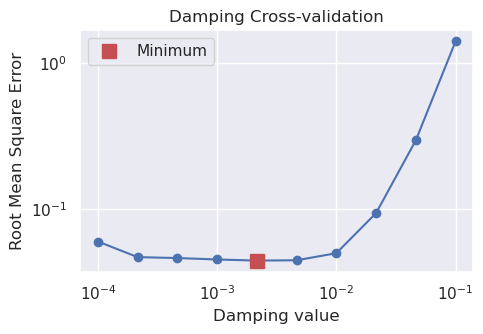

In [100]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist=layer_spacing / np.sqrt(2),
#     low=0,
#     high=1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving=True,
#     deriv_type="annulus",
#     solver_type="scipy least squares",
#     constraints=constraints,
# )

# fname = "../../synthetic_data/synthetic_simple_regional_sampled_damping_CV"

# dampings = np.logspace(-4, -1, 10)
# print(f"Damping values: {dampings}")

# scores, rmses = inv.inversion_optimal_parameters(
#     training_data= df_anomalies_sampled[df_anomalies_sampled.test==False],
#     testing_data = df_anomalies_sampled[df_anomalies_sampled.test==True],
#     parameter_values = dampings,
#     function = inv.inversion_damping_MSE,
#     plot = False,
#     plot_grids = False,
#     results_fname=fname,
#     progressbar=True,
#     true_surface=layer1,
#     inversion_region=inversion_region,
#     **kwargs,
# )

# # put scores and damping values into dict
# CV_results = dict(
#     scores=scores, dampings=dampings, rmses=rmses)

# # remove if exists
# pathlib.Path(fname).unlink(missing_ok=True)

# # save scores and dampings to pickle
# with open(f"{fname}.pickle", 'wb') as f:
#     pickle.dump(CV_results, f)

# # load scores and dampings from pickle
# with open(f"{fname}.pickle", "rb") as f:
#     CV_results = pickle.load(f)

# best = np.argmin(CV_results["scores"])
# print("Best score:", CV_results["scores"][best])
# print("Best damping:", CV_results["dampings"][best])

# # get best inversion result of each set
# with open(f"{fname}_trial_{best}.pickle", "rb") as f:
#     inv_result = pickle.load(f)

# plotting.plot_parameter_cv(
#     CV_results["scores"],
#     CV_results["dampings"],
#     logx=True,
#     logy=True,
#     param_name="Damping",
# )

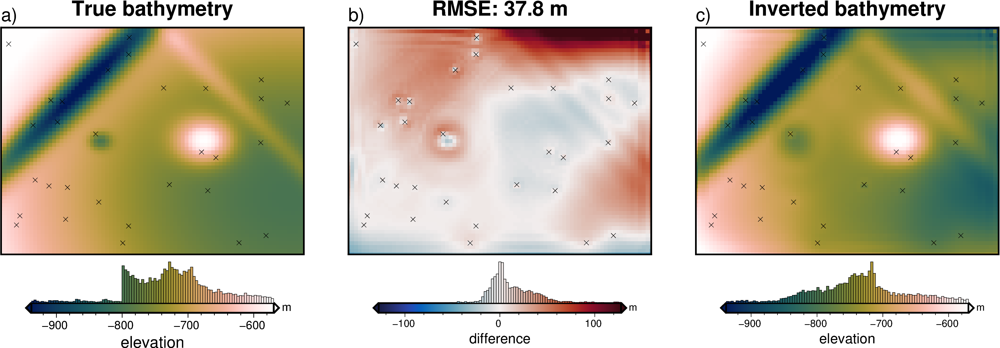

RMSE: 37.77762023460888
constraints RMSE: 2.36


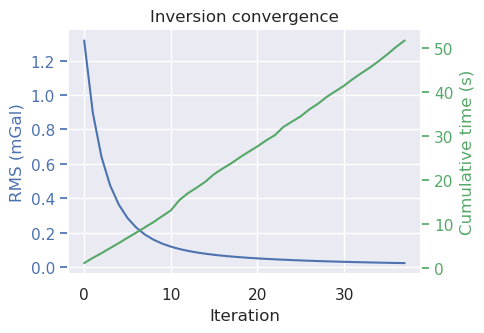

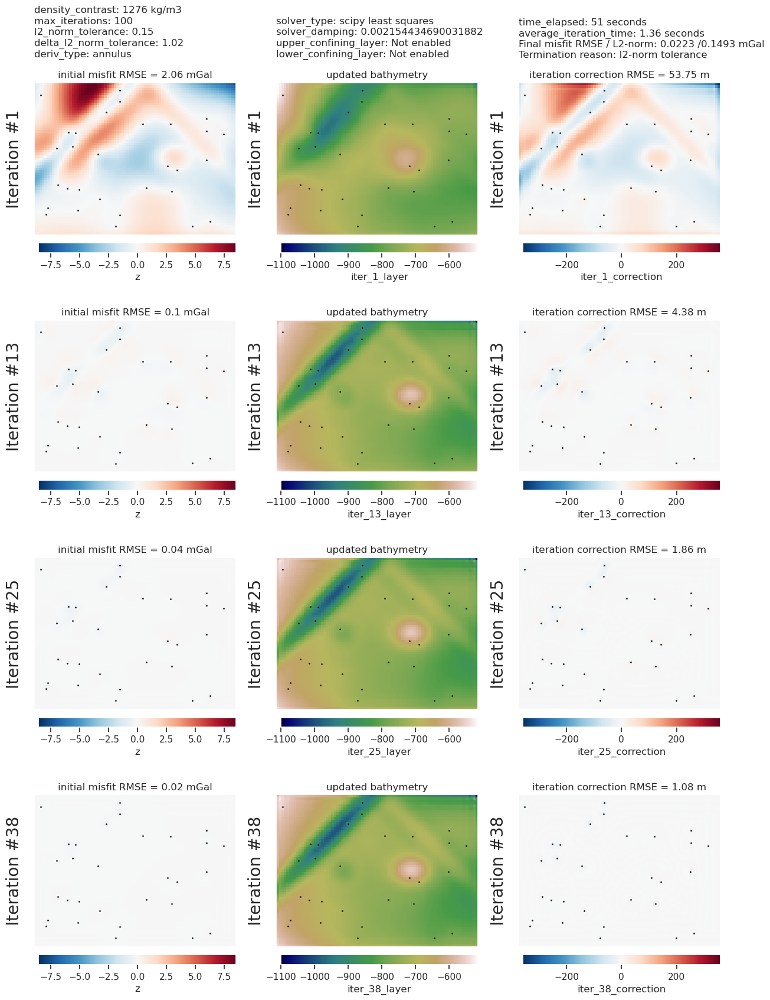

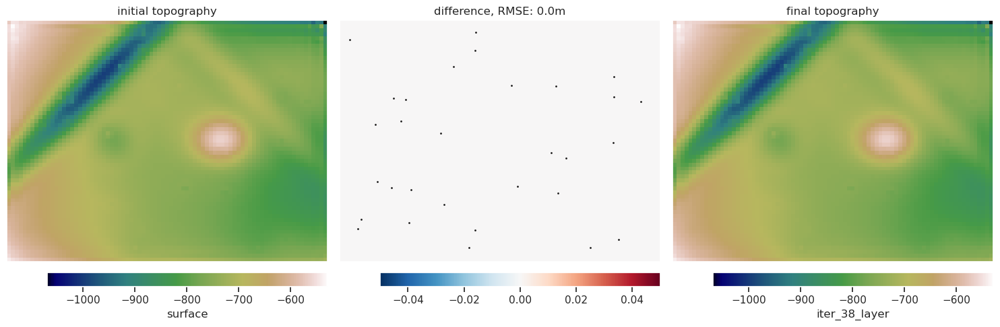

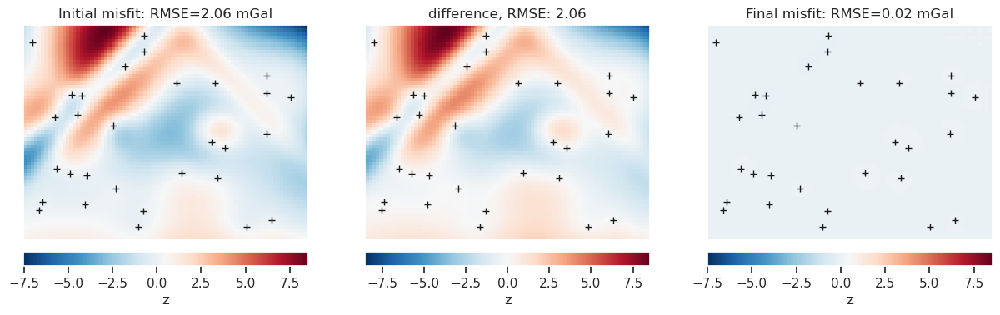

In [101]:
# with inv_utils.HiddenPrints():
#     _ = inv.inversion_RMSE(
#         results=inv_result,
#         input_grav=df_anomalies_sampled[df_anomalies_sampled.test == False],
#         inversion_region=inversion_region,
#         true_surface=layer1,
#         plot=True,
#         plot_type="pygmt",
#         xshift_amount=1.1,
#         label_offset="j0c/.2c",
#         # title_font = "16p,Helvetica-Bold,black",
#         robust=True,
#         **kwargs,
#     )

# plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

# _ = plotting.plot_inversion_results(
#     inv_result[2],
#     inv_result[1],
#     inv_result[3],
#     grav_region=inversion_region,
#     plot_iter_results=True,
#     plot_topo_results=True,
#     plot_grav_results=True,
#     iters_to_plot=4,
#     grav_spacing=grav_spacing,
#     constraints=constraints,
# )

# print(f"RMSE: {inv_result[0]}")
# print(f"constraints RMSE: {inv_result[-1]}")

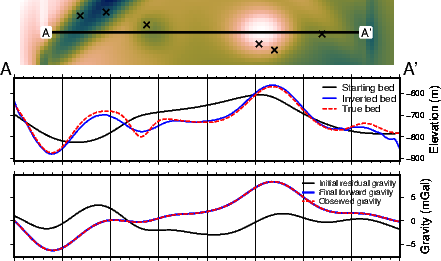

In [102]:
# plotting.plot_inversion_results_profile(
#     inv_result[1],
#     inv_result[2],
#     input_forward_column="layer1_forward",
#     constraints=constraints,
#     true_surface=layer1,
#     start=[inversion_region[0], 30e3],
#     stop=[inversion_region[1], 30e3],
#     map_buffer=0.1,
#     subplot_orientation="vertical",
#     data_legend_loc="jTR+o0c",
#     layers_legend_loc="jTR+o0c",
#     layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
#     data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
# )

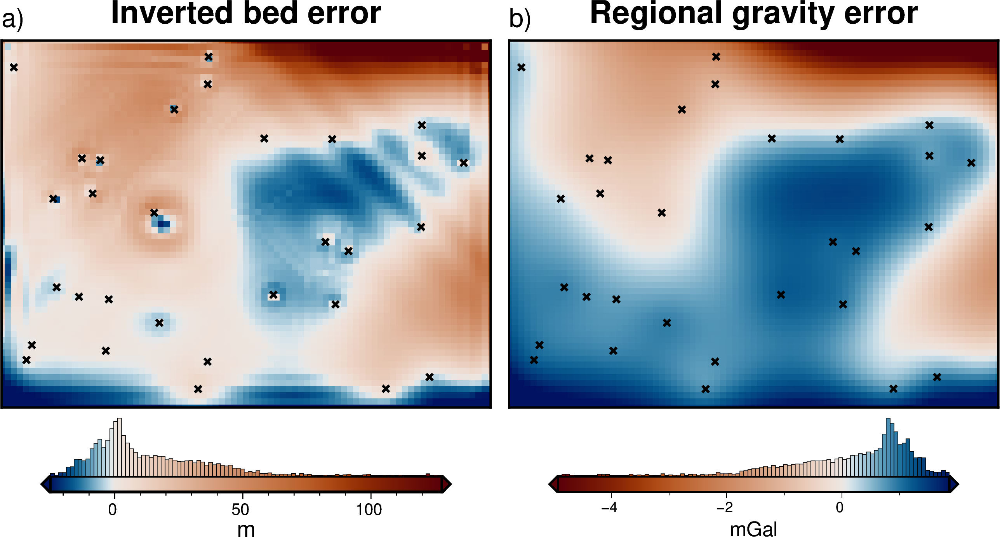

In [103]:
# # # inverted bed error
# ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
# cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
# final_bed = ds[cols[-1]]

# final_bed = final_bed.sel(
#     easting=slice(inversion_region[0], inversion_region[1]),
#     northing=slice(inversion_region[2], inversion_region[3]),
# )
# true_bed = layer1.sel(
#     easting=slice(inversion_region[0], inversion_region[1]),
#     northing=slice(inversion_region[2], inversion_region[3]),
# )
# bed_dif = true_bed - final_bed

# # regional separation error
# ds = (
#     df_anomalies[df_anomalies.test == False]
#     .set_index(["northing", "easting"])
#     .to_xarray()
# )
# true_reg = ds.Surface2

# ds = (
#     df_anomalies_sampled[df_anomalies_sampled.test == False]
#     .set_index(["northing", "easting"])
#     .to_xarray()
# )
# reg_dif = true_reg - ds.reg
# reg_dif -= np.nanmean(reg_dif)

# fig = maps.plot_grd(
#     bed_dif,
#     fig_height=8,
#     title="Inverted bed error",
#     hist=True,
#     points=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
#     points_pen="1.5p",
#     cmap="vik+h0",
#     cbar_label="m",
#     cbar_yoffset=1.5,
#     robust=True,
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="16p,Helvetica,black",
#     offset="j0c/.3",
#     no_clip=True,
# )
# fig = maps.plot_grd(
#     reg_dif,
#     title="Regional gravity error",
#     cmap=f"vik+h0",
#     reverse_cpt=True,
#     fig=fig,
#     hist=True,
#     points=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
#     points_pen="1.5p",
#     origin_shift="xshift",
#     cbar_label="mGal",
#     cbar_yoffset=1.5,
#     robust=True,
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="16p,Helvetica,black",
#     offset="j0c/.3",
#     no_clip=True,
# )
# fig.show()

# Optimize on damping for ensemble of noise levels and cell sizes

In [105]:
regional_kwargs = dict(
    input_forward_column="layer1_forward",
    input_grav_column="Gobs_shift",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    constraints=constraints,
    regional_method = "constraints",
    tension_factor = .25,
    grid_method="verde",
    dampings=np.logspace(-10, -5, num=20),
    constraint_block_size=grav_spacing,
    block_size= grav_spacing,
)

# noise_levels = [0,  .09] # decimal percent gaussian noise
# cell_sizes = [1e3, 10e3] # cell size to resample gravity data at
noise_levels = [0, .01, .02, .03, .04, .05, .06, .07, .08, .09] # decimal percent gaussian noise
cell_sizes = [1e3, 2e3, 3e3, 4e3, 5e3, 6e3, 7e3, 8e3, 9e3, 10e3,] # cell size to resample gravity data at

param_coords = []
eq_scores = []
anom_dfs = []
noise_stddevs = []
for (n,c) in product(noise_levels, cell_sizes, desc="Noise/Cell Size"):
    param_coords.append([n,c])

    # sample gravity at low resolution grid, regrid at full res with eq sources
    if c == layer_spacing:
        sampled_grav = full_res_grav.copy()
        eq_score = 1
    else:
        # parameter values, if using grid search
        # num = 20
        # dampings = list(np.logspace(-6, 2, num=num-1))
        # dampings.append(None)
        # depths = np.linspace(1, 50e3, num)

        #parameter ranges, if using optimization
        dampings = [10**-20, .1]
        depths = [1, 50e3]

        sampled_grav, eq_score = inv_utils.resample_gravity_with_test_points(
            grav_df = full_res_grav,
            grav_column = "Gobs",
            coord_columns = ["easting", "northing", "upward"],
            starting_training_spacing = layer_spacing,
            coarse_training_spacing = c,
            region = inversion_region,
            dampings = dampings,
            depths = depths,
            optimization = True,
            # optimization = False,
            n_trials = 100,
            plot=False,
            log_fname = "../../tmp_outputs/tmp",
        )
        # add layer1 starting forward grav into df
        sampled_grav["layer1_forward"] = full_res_grav.layer1_forward

    # add noise to data
    sampled_grav["Gobs"], stddev = synthetic.contaminate(
        sampled_grav.Gobs,
        stddev=n,
        percent=True,
        seed=0,
        return_stddev=True,
    )
    noise_stddevs.append(stddev)
    
    # recalculate misfit
    sampled_grav = inv.misfit(
        input_grav=sampled_grav,
        input_forward_column="layer1_forward",
        input_grav_column="Gobs",
        constraints=constraints,
    )
    
    # seperate the regional
    with inv_utils.HiddenPrints():
        df = regional.regional_seperation(
            input_grav=sampled_grav,
            **regional_kwargs,
        )

    eq_scores.append(eq_score)
    anom_dfs.append(df)

ensemble_fname = "../../synthetic_data/simple_regional_ensemble/synthetic_simple_regional_ensemble"

# save results to pickle dataframes
with open(f"{ensemble_fname}_anomalies.pickle", 'wb') as fout:
    pickle.dump(anom_dfs, fout)
with open(f"{ensemble_fname}_noise_cellsize.pickle", 'wb') as fout:
    pickle.dump(param_coords, fout)
with open(f"{ensemble_fname}_eq_scores.pickle", 'wb') as fout:
    pickle.dump(eq_scores, fout)
with open(f"{ensemble_fname}_noise_stddev.pickle", 'wb') as fout:
    pickle.dump(noise_stddevs, fout)

Noise/Cell Size:   0%|          | 0/4 [00:00<?, ?it/s]

DC shifted observed gravity by -1.92mGal to match forward gravity.


[I 2023-06-21 13:32:44,857] A new study created in Journal with name: ../../tmp_outputs/tmp184


  0%|          | 0/1 [00:00<?, ?it/s]

Best params: {'damping': 0.42224689376978974, 'depth': 47381.195427927254}
Best trial: 0
Best score: 0.8325531368852758
DC shifted observed gravity by -2.74mGal to match forward gravity.


/Users/home/tankerma/RIS_gravity_inversion/RIS_gravity_inversion/utils.py:175: UserWarning:




Standard deviation used for noise: [1.0846517025568339]
DC shifted observed gravity by -2.73mGal to match forward gravity.


/Users/home/tankerma/RIS_gravity_inversion/RIS_gravity_inversion/utils.py:175: UserWarning:


[I 2023-06-21 13:32:48,248] A new study created in Journal with name: ../../tmp_outputs/tmp185


  0%|          | 0/1 [00:00<?, ?it/s]

Best params: {'damping': 1.5779125145596946, 'depth': 35509.253800802326}
Best trial: 0
Best score: 0.8413205431715751
Standard deviation used for noise: [1.0677565097819999]
DC shifted observed gravity by -2.7mGal to match forward gravity.


/Users/home/tankerma/RIS_gravity_inversion/RIS_gravity_inversion/utils.py:175: UserWarning:




In [7]:
ensemble_fname = "../../synthetic_data/simple_regional_ensemble/synthetic_simple_regional_ensemble"

with open(f"{ensemble_fname}_anomalies.pickle", "rb") as f:
    anom_dfs = pickle.load(f)
with open(f"{ensemble_fname}_noise_cellsize.pickle", "rb") as f:
    param_coords = pickle.load(f)
with open(f"{ensemble_fname}_eq_scores.pickle", "rb") as f:
    eq_scores = pickle.load(f)
with open(f"{ensemble_fname}_noise_stddev.pickle", "rb") as f:
    noise_stddevs = pickle.load(f)
    
print(len(anom_dfs))
print(len(param_coords))
print(f"max noise: {np.max(noise_stddevs)}")

100
100
max noise: 1.1006968688999998


In [16]:
starting_prisms = copy.deepcopy(layer1_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    # region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
inversion_kwargs = dict(
    input_grav_column="Gobs_shift",
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    prism_layer=starting_prisms,
)

dampings = np.logspace(-4, -1, 10)
# dampings = [10**-1.2, 10**-1]
print(f"Damping values: {dampings}")

ensemble_fname = "../../synthetic_data/simple_regional_ensemble/synthetic_simple_regional_damping_CV_ensemble"

inversion_results = []
resulting_scores = []
resulting_dampings = []
resulting_rmses = []
for i, df in enumerate(tqdm(anom_dfs)):
    noise = param_coords[i][0]
    cellsize = param_coords[i][1]

    # set name and storage for the optimization
    set_fname = f"{ensemble_fname}_noise_{noise}_cellsize_{cellsize}"

#     with inv_utils.HiddenPrints():
#         CV_scores, rmses = inv.inversion_optimal_parameters(
#             training_data= df[df.test==False],
#             testing_data = df[df.test==True],
#             parameter_values = dampings,
#             function = inv.inversion_damping_MSE,
#             inversion_region = inversion_region,
#             true_surface = layer1,
#             plot = False,
#             plot_grids = False,
#             results_fname = set_fname,
#             progressbar = False,
#             **inversion_kwargs,
#         )

#     # put all scores and damping values into dict
#     CV_results = dict(CV_scores=CV_scores, dampings=dampings, rmses=rmses)

#     # remove if exists
#     pathlib.Path(f"{set_fname}.pickle").unlink(missing_ok=True)

#     # save scores and dampings of each set to pickle
#     with open(f"{set_fname}.pickle", 'wb') as f:
#         pickle.dump(CV_results, f)

    # load best inversion results of each set of noise/sampling
    with open(f"{set_fname}.pickle", "rb") as f:
        CV_results = pickle.load(f)

    # get best parameters of each set
    best = np.argmin(CV_results["CV_scores"])
    best_score = CV_results["CV_scores"][best]
    best_rmse = CV_results["rmses"][best]
    best_damping = CV_results["dampings"][best]

    # get best inversion result of each set
    with open(f"{set_fname}_trial_{best}.pickle", "rb") as f:
        inv_result = pickle.load(f)

    inversion_results.append(inv_result)
    resulting_dampings.append(best_damping)
    resulting_scores.append(best_score)
    resulting_rmses.append(best_rmse)
    
    # delete other results to save space
    fnames = []
    for i in range(len(dampings)):
        if i == best:
            pass
        else:
            fnames.append(f"{set_fname}_trial_{i}.pickle")
    for f in fnames:
        pathlib.Path(f).unlink(missing_ok=True)
        
        
df = pd.DataFrame({
    "noise": [x[0] for x in param_coords[0:len(resulting_scores)]],
    "cell_size": [x[1] for x in param_coords[0:len(resulting_scores)]],
    "Score": resulting_scores,
    "RMSE": resulting_rmses,
    "Damping": resulting_dampings,
    "Eq source score": eq_scores,
})
df.to_csv(
    f"{ensemble_fname}.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)
df

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]


  0%|          | 0/100 [00:00<?, ?it/s]

,noise,cell_size,Score,RMSE,Damping,Eq source score
0,0.00,1000.0,0.044412,37.085853,0.002154,1.000000
1,0.00,2000.0,0.044423,37.155595,0.002154,0.999989
2,0.00,3000.0,0.044426,37.463635,0.002154,0.999909
3,0.00,4000.0,0.044729,37.751464,0.002154,0.999456
4,0.00,5000.0,0.044543,37.832799,0.002154,0.995181
...,...,...,...,...,...,...
95,0.09,6000.0,1.157511,56.665318,0.010000,0.987034
96,0.09,7000.0,1.145567,59.014166,0.010000,0.967789
97,0.09,8000.0,1.153111,61.772038,0.010000,0.944581
98,0.09,9000.0,1.158390,64.245533,0.010000,0.916390


In [8]:
ensemble_fname = "../../synthetic_data/simple_regional_ensemble/synthetic_simple_regional_damping_CV_ensemble"

df = pd.read_csv(
    f"{ensemble_fname}.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df.sort_values(by="Score")

,noise,cell_size,Score,RMSE,Damping,Eq source score
0,0.00,1000.0,0.044412,37.085853,0.002154,1.000000
1,0.00,2000.0,0.044423,37.155595,0.002154,0.999989
2,0.00,3000.0,0.044426,37.463635,0.002154,0.999909
4,0.00,5000.0,0.044543,37.832799,0.002154,0.995181
3,0.00,4000.0,0.044729,37.751464,0.002154,0.999456
...,...,...,...,...,...,...
91,0.09,2000.0,1.147826,56.556281,0.010000,0.999945
97,0.09,8000.0,1.153111,61.772038,0.010000,0.944581
95,0.09,6000.0,1.157511,56.665318,0.010000,0.987034
98,0.09,9000.0,1.158390,64.245533,0.010000,0.916390


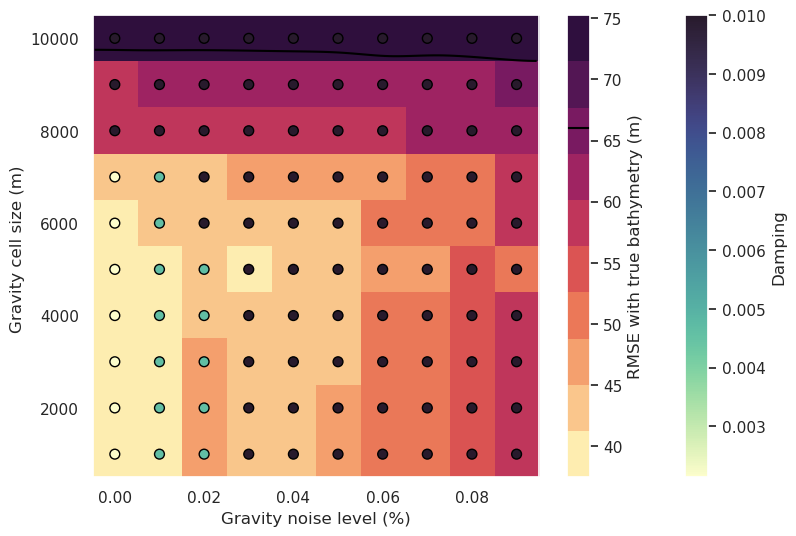

In [9]:
fig = plotting.plot_noise_cellsize_ensemble(
    df,
    background="RMSE",
    background_title="RMSE with true bathymetry (m)",
    # background="Score",
    # background_title="Gravity CV score",
    # background="Damping",
    # background_title="Damping",
    # background="Eq source score",
    # background_title="Eq source score",
    # background_color_log = True,
    background_robust=True,
    # points_color=df.RMSE,
    points_color=df.Damping,
    # points_color=df["Eq source score"],
    # points_color=df.Score,
    # points_size=df.RMSE,
    # points_size=df.Score,
    # points_scaling=80,
    # points_color_log=True,
    points_robust=True,
    plot_contours=[66],
)

In [ ]:
plotting.plot_ensemble_as_lines(
    df,
    x_col="noise",
    groupby_col="cell_size",
    x_label="Noise (decimal %)",
    cbar_label="Cell size (m)",
)

In [ ]:
plotting.plot_ensemble_as_lines(
    df,
    x_col="cell_size",
    groupby_col="noise",
    x_label="Cell size (m)",
    cbar_label="Noise (decimal %)",
)

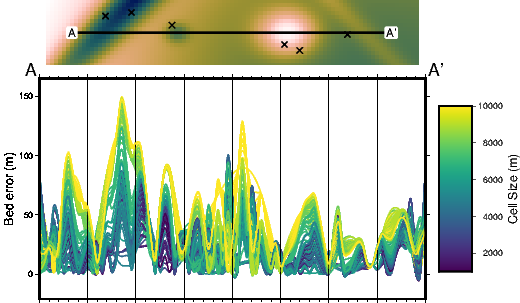

In [19]:
prism_results = [x[1] for x in inversion_results]  # [0:2]]
grav_results = [x[2] for x in inversion_results]  # [0:2]]

plotting.plot_inversion_ensemble_results_profile(
    prism_results,
    grav_results,
    input_forward_column="layer1_forward",
    name_prefixes=[i for i, j in enumerate(grav_results)],
    constraints=constraints,
    true_surface=layer1,
    true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
    start=[inversion_region[0], 30e3],
    stop=[inversion_region[1], 30e3],
    map_buffer=0.1,
    layers_legend_loc="jBR",
    layers_legend=False,
    layers_line_cmap="viridis",
    layers_color=df.cell_size.values,
    layers_line_cmap_label="Cell Size (m)",
    layers_frame=["nesW", "xafg", "ya+lBed error (m)"],
    # data_legend_loc="jTR",
    # data_legend = False,
    # data_line_cmap = "matter",
    # data_color = df.cell_size.values,
    # data_line_cmap_label="Cell Size",
    # data_frame = ["neSW","xafg", "ya+lRegional error (mGal)"],
    plot_regional_error=False,
    absolute_bed_error=True,
)

In [ ]:
prism_results = [x[1] for x in inversion_results]  # [0:2]]
grav_results = [x[2] for x in inversion_results]  # [0:2]]

plotting.plot_inversion_ensemble_results_profile(
    prism_results,
    grav_results,
    input_forward_column="layer1_forward",
    name_prefixes=[i for i, j in enumerate(grav_results)],
    constraints=constraints,
    true_surface=layer1,
    true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
    start=[inversion_region[0], 30e3],
    stop=[inversion_region[1], 30e3],
    map_buffer=0.1,
    layers_legend_loc="jBR",
    layers_legend=False,
    layers_line_cmap="viridis",
    layers_color=df.noise.values,
    layers_line_cmap_label="Noise (%)",
    layers_frame=["nesW", "xafg", "ya+lBed error (m)"],
    # data_legend_loc="jTR",
    # data_legend = False,
    # data_line_cmap = "matter",
    # data_color = df.cell_size.values,
    # data_line_cmap_label="Cell Size",
    # data_frame = ["neSW","xafg", "ya+lRegional error (mGal)"],
    plot_regional_error=False,
    absolute_bed_error=True,
)

## Compare ensembles with and without regional

In [ ]:
ensemble_fname_no_reg = "../../synthetic_data/simple_ensemble/synthetic_simple_damping_CV_ensemble"

df_no_reg = pd.read_csv(
    f"{ensemble_fname_no_reg}.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df_no_reg.sort_values(by="Score")

In [ ]:
figs = []
for d in [df, df_no_reg]:
    fig = plotting.plot_noise_cellsize_ensemble(
        d,
        # background="RMSE",
        # background_title="RMSE with true bathymetry (m)",
        # background="Score",
        # background_title="Gravity CV score",
        # background="Damping",
        # background_title="Damping",
        background="Eq source score",
        background_title="Eq source score",
        # background_color_log = True,
        background_robust=True,
        # points_color=df.RMSE,
        # points_color=df.Damping,
        points_color=df["Eq source score"],
        # points_color=df.Score,
        # points_size=df.RMSE,
        # points_size=df.Score,
        # points_scaling=80,
        # points_color_log=True,
        # points_robust=True,
    )
    figs.append(fig)
figs

In [ ]:
plotting.merge_mpl_figs(figs, axis=0, dpi=100)